# Análise de Dados — Airbnb na cidade de São Paulo

O [Airbnb](https://www.airbnb.com.br/) se consolidou como uma das maiores plataformas de hospitalidade do mundo, conectando viajantes a anfitriões em mais de 220 países e regiões — sem possuir um único hotel. Recentemente, a empresa ultrapassou a marca de 1,5 bilhão de hóspedes recebidos desde sua fundação, com mais de 8 milhões de imóveis ativos e receita anual superior a US$ 12 bilhões.

<img src="https://i.pinimg.com/736x/70/80/b2/7080b24c3980c8f4d29412746b5c7ce9.jpg" width="25%" style="display: block; margin: 0 auto;">

No Brasil, São Paulo desponta como um dos mercados mais dinâmicos da plataforma na América Latina. Com dezenas de milhares de imóveis listados e crescimento acelerado ano a ano, a cidade oferece um cenário rico para análise: diversidade de bairros, faixas de preço variadas e uma competição intensa entre anfitriões.

O portal [Inside Airbnb](http://insideairbnb.com/get-the-data.html) disponibiliza publicamente dados sobre anúncios, disponibilidade, preços e reviews de diversas cidades do mundo. Em junho de 2026, São Paulo ganhou um [dashboard dedicado](https://insideairbnb.com/s%C3%A3o-paulo), reforçando a relevância do mercado paulistano para estudo.

In [ ]:
# Importando as bibliotecas
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import geopandas as gpd
import folium
import shap
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

pd.set_option('display.max_columns', None)
%matplotlib inline

### Objetivos da análise

Neste notebook, exploramos os dados de anúncios do Airbnb no município de São Paulo com o foco em:

- Compreender o perfil dos imóveis anunciados (tipo de acomodação, número de quartos, capacidade);
- Analisar a distribuição de preços por noite e identificar outliers;
- Mapear a concentração geográfica dos anúncios por bairro e zona da cidade;
- Investigar padrões de disponibilidade e sua relação com avaliações de hóspedes;
- Avaliar o perfil dos anfitriões (casuais vs. profissionais) e o impacto no mercado;
- Extrair insights acionáveis para potenciais anfitriões, investidores e pesquisadores do mercado de *short-term rental*.

> *Os dados utilizados neste projeto são públicos e foram obtidos em [julho de 2026], refletindo um recorte temporal da plataforma naquele período.*

In [2]:
# Importando o arquivo listings.csv.gz para um DataFrame
df = pd.read_csv("https://data.insideairbnb.com/brazil/sp/s%C3%A3o-paulo/2026-06-14/data/listings.csv.gz")

## Análise dos dados

Primeiramente, precisamos entender a estrutura do nosso dataset: o que cada coluna representa, quantas entradas temos, quais variáveis são numéricas ou categóricas e onde podem existir lacunas. Essa análise inicial garante uma base correta e confiável para toda a análise posterior, evitando erros nas conclusões seguintes.

> **Sobre o dataset:** Utilizamos a versão completa dos dados de São Paulo fornecida pelo [Inside Airbnb](http://insideairbnb.com/get-the-data.html) — o arquivo `listings.csv.gz`. Essa versão inclui informações detalhadas que a versão resumida não oferece, como avaliações por categoria (limpeza, localização, comunicação), políticas de cancelamento, amenidades, licenças e indicadores de *Superhost*. Escolhemos a versão completa para permitir uma análise mais profunda.

Primeiramente vamos observar as primeiras entradas do nosso dataset.

In [3]:
# Visualização das trÊs primeiras entradas do dataset
df.head(3)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_profile_id,host_profile_url,host_name,host_since,hosts_time_as_user_years,hosts_time_as_user_months,hosts_time_as_host_years,hosts_time_as_host_months,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,price_quote_checkin_date,price_quote_checkout_date,price_quote_total_price,price_quote_price_per_night,price_quote_raw,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,4917,https://www.airbnb.com/rooms/4917,20260614072545,2026-06-16,city scrape,Resort Condo Near Av. Paulista,"Comfortable 2 bedrooms (1 master suite), 2 bat...",NaN,https://a0.muscache.com/pictures/hosting/Hosti...,5618,https://www.airbnb.com/users/show/5618,1462506497915065828,https://www.airbnb.com/users/profile/146250649...,Alessandro,NaN,17,5,15,5,"Rome, Italy","Hi, I’m Alex, a Brazilian with Italian roots w...",NaN,NaN,NaN,t,NaN,https://a0.muscache.com/im/pictures/user/User-...,NaN,69,NaN,NaN,t,t,NaN,Vila Mariana,Vila Mariana,-23.57419,-46.63973,Entire condo,Entire home/apt,4,2.0,2 baths,2.0,3.0,"[""Free washer \u2013 In unit"", ""Ethernet conne...",$540.43,2026-07-21,2026-08-04,7566.00,540.43,"{""quote"": {""taxes"": null, ""currency"": ""USD"", ""...",5.0,1125.0,5.0,21.0,1125.0,1125.0,19.4,1125.0,NaN,t,2,19,32,57,2026-06-16,65,5,0,56,5,50,27022.0,2014-11-10,2026-05-07,4.85,4.91,4.65,4.94,4.94,4.97,4.67,NaN,NaN,1,1,0,0,0.46
1,54614,https://www.airbnb.com/rooms/54614,20260614072545,2026-06-16,city scrape,Nice area/Cozy flat/ Building rooftop pool,"Small, modern and charming flat. Cozy standard...",NaN,https://a0.muscache.com/pictures/31da1f7a-2d33...,256576,https://www.airbnb.com/users/show/256576,1462513920747223748,https://www.airbnb.com/users/profile/146251392...,Lílian,NaN,15,8,15,5,"São Paulo, Brazil","Frelancer journalist and audiovisual producer,...",NaN,NaN,NaN,f,NaN,https://a0.muscache.com/im/pictures/user/6896e...,NaN,1,NaN,NaN,t,t,NaN,Santa Cecilia,Se,-23.54153,-46.65362,Entire rental unit,Entire home/apt,3,1.0,1 bath,1.0,1.0,"[""Free washer \u2013 In unit"", ""Fire extinguis...",$289.04,2026-07-05,2026-08-04,8671.32,289.04,"{""quote"": {""taxes"": null, ""currency"": ""USD"", ""...",30.0,90.0,30.0,30.0,90.0,90.0,30.0,90.0,NaN,t,11,41,71,71,2026-06-16,209,1,1,71,0,60,17342.0,2015-12-14,2026-05-28,4.97,4.97,4.85,5.00,4.99,4.97,4.93,NaN,NaN,1,1,0,0,1.63
2,82935,https://www.airbnb.com/rooms/82935,20260614072545,2026-06-14,city scrape,Oscar Freire - Hospital das Clínicas e Nu Bank,I live in a 3-bedroom apartment in the most re...,NaN,https://a0.muscache.com/pictures/1cb69bb6-bb68...,451565,https://www.airbnb.com/users/show/451565,1462511917526407290,https://www.airbnb.com/users/profile/146251191...,Thaïs,NaN,15,2,15,2,"Sao Paulo, Brazil","My name is Thaïs, I love meeting people, 

Vamos prosseguir analisando a quantidade de entradas (linhas) que nosso conjunto de dados possui, a quantidade de variáveis (colunas/ atributos) que estão disponíveis e ainda visualizar os tipos de dados presentes em cada coluna..

In [4]:
# Identificando o volume de dados do dataset
print("Entradas:\t {}".format(df.shape[0]))
print("Atributos:\t {}\n".format(df.shape[1]))

# Verificando os tipos de dados
display(df.dtypes)

Entradas:	 42354
Atributos:	 90



id                                                int64
listing_url                                      object
scrape_id                                         int64
last_scraped                                     object
source                                           object
                                                 ...   
calculated_host_listings_count                    int64
calculated_host_listings_count_entire_homes       int64
calculated_host_listings_count_private_rooms      int64
calculated_host_listings_count_shared_rooms       int64
reviews_per_month                               float64
Length: 90, dtype: object

Agora vamos verificar a estrutura geral do nosso dataset.

In [5]:
# Verificando a estrutura do dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42354 entries, 0 to 42353
Data columns (total 90 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            42354 non-null  int64  
 1   listing_url                                   42354 non-null  object 
 2   scrape_id                                     42354 non-null  int64  
 3   last_scraped                                  42354 non-null  object 
 4   source                                        42354 non-null  object 
 5   name                                          42354 non-null  object 
 6   description                                   41230 non-null  object 
 7   neighborhood_overview                         0 non-null      float64
 8   picture_url                                   42354 non-null  object 
 9   host_id                                       42354 non-null 

## Dimensões do dataset

| Métrica | Valor |
|---|---|
| **Entradas (linhas)** | 42.354 |
| **Atributos (colunas)** | 90 |

O conjunto de dados possui pouco mais de **42 mil anúncios** distribuídos em **90 variáveis** — um volume considerável que demanda uma etapa de seleção e filtragem de colunas relevantes antes da análise. Muitas variáveis são redundantes (ex.: múltiplas colunas de URL, *scraping metadata*, versões duplicadas de contagens) e serão descartadas nas etapas seguintes.

### Tipos de variáveis

Os tipos identificados pelo *pandas* são:

- **int64** — variáveis inteiras (contagens, identificadores, coordenadas truncadas);
- **float64** — variáveis decimais (avaliações, coordenadas, taxas);
- **object** — variáveis de texto (nomes, URLs, datas como string, amenidades, preço formatado).

## Tratamento dos dados

Com 90 variáveis disponíveis, a primeira tarefa foi **selecionar as colunas relevantes** e descartar o que não agregava à análise. Em seguida, tratamos os problemas mais comuns em dados do Inside Airbnb: preços como string, valores ausentes, duplicatas e outliers.

### Seleção de variáveis

Das 90 colunas do dataset, selecionamos **24 variáveis** (listadas no dicionário da seção anterior) com base nos seguintes critérios:

- **Relevância analítica**: variáveis que respondem às perguntas do projeto (preço, localização, avaliações, perfil do anfitrião, regulação);
- **Baixa redundância**: quando há colunas duplicadas ou quase idênticas (ex.: `neighbourhood` vs. `neighbourhood_cleansed`), mantemos apenas a versão normalizada;
- **Exclusão de metadados**: colunas como `scrape_id`, `last_scraped`, `source`, `listing_url`, `picture_url` e variações de `minimum_minimum_nights` não aportam valor analítico e foram removidas.

### Dicionário de variáveis

| Variável | Descrição |
|---|---|
| `id` | Identificador único do imóvel na plataforma |
| `name` | Nome do anúncio, definido pelo anfitrião |
| `host_id` | Identificador único do anfitrião |
| `host_is_superhost` | Indica se o anfitrião possui o selo *Superhost* (true/false) |
| `calculated_host_listings_count` | Número total de imóveis do mesmo anfitrião (calculado pelo Inside Airbnb) |
| `host_identity_verified` | Indica se a identidade do anfitrião foi verificada |
| `neighbourhood_cleansed` | Nome do bairro (normalizado pelo Inside Airbnb) |
| `latitude` | Coordenada de latitude da propriedade |
| `longitude` | Coordenada de longitude da propriedade |
| `room_type` | Tipo de acomodação oferecida (ex.: *Entire home/apt*, *Private room*, *Shared room*) |
| `accommodates` | Capacidade máxima de hóspedes |
| `bedrooms` | Número de quartos |
| `bathrooms` | Número de banheiros |
| `price` | Preço por noite, em moeda local |
| `minimum_nights` | Quantidade mínima de noites por reserva |
| `maximum_nights` | Quantidade máxima de noites por reserva |
| `number_of_reviews` | Número total de avaliações recebidas |
| `last_review` | Data da última avaliação registrada |
| `review_scores_rating` | Nota geral do anúncio (0 a 5) |
| `review_scores_cleanliness` | Nota de limpeza |
| `review_scores_location` | Nota de localização |
| `review_scores_communication` | Nota de comunicação com o anfitrião |
| `availability_365` | Dias disponíveis para reserva dentro de 365 dias |
| `amenities` | Lista de amenidades oferecidas (ex.: Wi-Fi, piscina, estacionamento) |

In [6]:
# Selecionando as colunas escolhidas
colunas_selecionadas = [
    # Identificação
    'id', 'name',
    # Anfitrião
    'host_id', 'host_is_superhost', 'calculated_host_listings_count',
    'host_identity_verified',
    # Localização
    'neighbourhood_cleansed', 'latitude', 'longitude',
    # Imóvel
    'room_type', 'accommodates', 'bedrooms', 'bathrooms', 'amenities',
    # Preço e reserva
    'price', 'minimum_nights', 'maximum_nights', 'availability_365',
    # Avaliações
    'number_of_reviews', 'last_review', 'review_scores_rating',
    'review_scores_cleanliness', 'review_scores_location',
    'review_scores_communication',
]

df = df[colunas_selecionadas].copy()
print(f"Dimensões após seleção: {df.shape}")

Dimensões após seleção: (42354, 24)


### Tradução de labels e valores categóricos

Para manter o notebook mais legível, definimos dicionários auxiliares para permitir saídas de resultados em português. Esses mapeamentos não alteram o DataFrame — são aplicados apenas no momento de exibir resultados, preservando os nomes originais das colunas.

In [7]:
# Dicionário de labels em português
labels = {
    'price': 'Preço (R$)',
    'bedrooms': 'Quartos',
    'bathrooms': 'Banheiros',
    'accommodates': 'Capacidade',
    'minimum_nights': 'Mínimo de noites',
    'maximum_nights': 'Máximo de noites',
    'number_of_reviews': 'Nº de avaliações',
    'calculated_host_listings_count': 'Total de imóveis do anfitrião',
    'availability_365': 'Disponibilidade (365 dias)',
    'review_scores_rating': 'Nota geral',
    'review_scores_cleanliness': 'Nota de limpeza',
    'review_scores_location': 'Nota de localização',
    'review_scores_communication': 'Nota de comunicação',
    'last_review': 'Última avaliação',
    'room_type': 'Tipo de acomodação',
    'neighbourhood_cleansed': 'Bairro',
    'host_is_superhost': 'Superhost',
    'host_identity_verified': 'Identidade verificada'
}

# Dicionário de tradução de valores categóricos
traducoes_valores = {
    'room_type': {
        'Entire home/apt': 'Casa/apto inteiro',
        'Private room': 'Quarto privado',
        'Shared room': 'Quarto compartilhado',
        'Hotel room': 'Quarto de hotel'
    },
    'host_is_superhost': {True: 'Sim', False: 'Não'},
    'host_identity_verified': {True: 'Sim', False: 'Não'}
}

def traduzir_serie(serie, coluna):
    if coluna in traducoes_valores:
        return serie.map(traducoes_valores[coluna])
    return serie

### Etapas de tratamento dos dados

Após a seleção das variáveis de interesse, nosso processo de tratamento seguirá uma ordem lógica dividida em duas fases principais: primeiro diagnosticamos a saúde dos dados, e depois aplicamos as correções necessárias.

**Fase 1: Preparação e diagnóstico**

1. **Conversão de tipos:** Transformar a variável `price` (de texto para numérico/float), converter datas (`last_review`) para o formato `datetime` e ajustar as colunas booleanas (`t`/`f` para `True`/`False`).
2. **Mapeamento de dados ausentes:** Avaliar o percentual de valores nulos (`NaN`) por coluna e investigar suas causas, para decidir — com base no impacto analítico — se devemos remover linhas, imputar valores ou manter essas entradas.
3. **Estatística descritiva:** Utilizar o método `describe()` para identificar *outliers* (valores atípicos) que possam distorcer a realidade do mercado.

**Fase 2: Limpeza e filtragem**

4. **Remoção de duplicatas:** Verificar e eliminar possíveis anúncios duplicados utilizando o identificador único (`id`).
5. **Filtragem de outliers:** Remover as anomalias identificadas na etapa descritiva (ex.: diárias com preços irreais ou `minimum_nights` acima de 365 dias, que fogem do escopo de aluguel de curta temporada).
6. **Validação geográfica:** Garantir que as coordenadas de `latitude` e `longitude` dos anúncios restantes estejam efetivamente contidas nos limites da cidade de São Paulo.

### 1. Conversão dos tipos de variáveis

O primeiro passo prático é adequar os tipos de dados para permitir operações matemáticas e temporais. Vamos limpar os caracteres especiais da variável financeira, converter a data da última avaliação e transformar as colunas de texto com `t`/`f` em booleanos nativos (`True`/`False`).

In [8]:
# 1. Convertendo os tipos de variáveis

# price: remover o '$', ',', os espaços em branco e converter para numérico (float)
df['price'] = (
    df['price']
    .str.replace('$', '', regex=False)
    .str.replace(',', '', regex=False)
    .str.strip()
    .astype(float)
)

# last_review: converter para datetime
df['last_review'] = pd.to_datetime(df['last_review'], errors='coerce')

# Booleanos: 't'/'f' → True/False
bool_cols = ['host_is_superhost', 'host_identity_verified']
for col in bool_cols:
    df[col] = df[col].map({'t': True, 'f': False})

print("Tipos de variáveis após conversão:")
print(df[['price', 'last_review'] + bool_cols].dtypes)
print(f"\nPrice - min: ${df['price'].min():.2f} | max: ${df['price'].max():.2f} | média: ${df['price'].mean():.2f}")

Tipos de variáveis após conversão:
price                            float64
last_review               datetime64[ns]
host_is_superhost                   bool
host_identity_verified              bool
dtype: object

Price - min: $11.53 | max: $57127.00 | média: $418.05


### 2.1. Diagnóstico de valores ausentes

O primeiro passo é mapear o percentual de valores nulos em cada coluna para decidir o tratamento adequado.

In [9]:
print("--- Valores ausentes por coluna (%) ---")
all_null = ((df.isnull().sum()/df.shape[0]*100).sort_values(ascending=False))
print(all_null[all_null > 0].round(2))

--- Valores ausentes por coluna (%) ---
review_scores_communication    13.63
review_scores_location         13.63
review_scores_cleanliness      13.63
review_scores_rating           13.63
last_review                    13.63
bedrooms                       13.38
bathrooms                       5.90
price                           1.23
minimum_nights                  0.03
maximum_nights                  0.03
dtype: float64


### 2.2. Investigação: por que as notas de avaliação são nulas?

As colunas `review_scores_rating` e `last_review` apresentam 13,63% de nulos. A hipótese é de que esses anúncios **nunca receberam avaliação**. Para verificar, cruzamos os anúncios sem nota com a coluna `number_of_reviews`.

In [10]:
# Verificando se anúncios com NaN em review_scores_rating têm number_of_reviews = 0
sem_nota = df[df['review_scores_rating'].isna()]
print(f"Anúncios com review_scores_rating nulos: {sem_nota.shape[0]}")
print(f"Anúncios com number_of_reviews = 0: {(sem_nota['number_of_reviews'] == 0).sum()}")
print(f"Anúncios com number_of_reviews > 0: {(sem_nota['number_of_reviews'] > 0).sum()}")

Anúncios com review_scores_rating nulos: 5771
Anúncios com number_of_reviews = 0: 5771
Anúncios com number_of_reviews > 0: 0


### 2.3. Confirmação: são os mesmos anúncios?

Os totais batem (5.771 em ambos os grupos), mas precisamos confirmar que são os **mesmos IDs** — e não grupos diferentes que coincidentemente têm o mesmo tamanho.

In [11]:
# Conjuntos de IDs
ids_sem_nota = set(df[df['review_scores_rating'].isna()]['id'])
ids_sem_review = set(df[df['number_of_reviews'] == 0]['id'])

print(f"Anúncios com review_scores_rating nulo: {len(ids_sem_nota)}")
print(f"Anúncios com number_of_reviews = 0: {len(ids_sem_review)}")
print(f"Interseção (estão em ambos): {len(ids_sem_nota & ids_sem_review)}")
print(f"Só no grupo 'sem nota': {len(ids_sem_nota - ids_sem_review)}")
print(f"Só no grupo 'sem review': {len(ids_sem_review - ids_sem_nota)}")

Anúncios com review_scores_rating nulo: 5771
Anúncios com number_of_reviews = 0: 5771
Interseção (estão em ambos): 5771
Só no grupo 'sem nota': 0
Só no grupo 'sem review': 0


### 2.4. Tratamento de valores ausentes

A correspondência é exata: os 5.771 anúncios sem nota são os mesmos 5.771 com zero avaliações. Os valores ausentes **não são erros de coleta** — são anúncios novos ou inativos que nunca foram avaliados. Por isso, mantemos como `NaN` e filtramos apenas nas análises específicas de avaliação.

| Coluna | % de nulos | Tratamento |
|---|---|---|
| `review_scores_*` / `last_review` | 13,63% | Manter como `NaN` (sem review = sem nota) |
| `bedrooms` | 13,38% | Imputar com mediana |
| `bathrooms` | 5,90% | Imputar com mediana |
| `price` | 1,23% | Remover linhas (sem preço = sem valor analítico) |
| `minimum_nights` / `maximum_nights` | 0,03% | Remover linhas |

In [12]:
# bedrooms e bathrooms: imputar com mediana
df['bedrooms'] = df['bedrooms'].fillna(df['bedrooms'].median())
df['bathrooms'] = df['bathrooms'].fillna(df['bathrooms'].median())

# price: remover linhas sem preço
df = df.dropna(subset='price')

# minimum_nights e maximum_nights: remover linhas nulas
df = df.dropna(subset=['minimum_nights', 'maximum_nights'])

print(f"Após tratamento de valores ausentes temos {df.shape[0]} entradas.")
print(f"\nValores ausentes restantes (%):")
restantes = (df.isnull().sum() / df.shape[0] * 100).round(2)
print(restantes[restantes > 0])

Após tratamento de valores ausentes temos 41821 entradas.

Valores ausentes restantes (%):
last_review                    13.19
review_scores_rating           13.19
review_scores_cleanliness      13.19
review_scores_location         13.19
review_scores_communication    13.19
dtype: float64


### 3. Estatística descritiva

Com os valores ausentes tratados, utilizamos o método `describe()` para obter medidas estatísticas das variáveis numéricas. O objetivo é identificar possíveis *outliers* e anomalias que possam distorcer a análise, subsidiando as decisões de filtragem da Fase 2.

In [13]:
# 3. Estatística descritiva

# Excluindo colunas que não fazem sentido no describe
cols_excluir = ['id', 'host_id', 'latitude', 'longitude']
print("--- Estatística descritiva das variáveis numéricas ---")
desc = df.drop(columns=cols_excluir).describe().T.round(2)
desc.index = [labels.get(idx, idx) for idx in desc.index]
display(desc)

--- Estatística descritiva das variáveis numéricas ---


,count,mean,min,25%,50%,75%,max,std
Total de imóveis do anfitrião,41821.0,42.318572,1.0,1.0,6.0,46.0,496.0,81.970043
Capacidade,41821.0,2.959638,1.0,2.0,2.0,4.0,16.0,1.954246
Quartos,41821.0,1.202339,0.0,1.0,1.0,1.0,46.0,0.719008
Banheiros,41821.0,1.168085,0.5,1.0,1.0,1.0,20.0,0.627763
Preço (R$),41821.0,418.061719,11.53,250.0,331.0,429.66,57127.0,817.665821
Mínimo de noites,41821.0,2.281677,1.0,1.0,1.0,2.0,90.0,4.273336
Máximo de noites,41821.0,565.38177,2.0,360.0,365.0,1125.0,1125.0,422.507396
Disponibilidade (365 dias),41821.0,261.295378,0.0,173.0,315.0,355.0,365.0,108.585186
Nº de avaliações,41821.0,37.472681,0.0,3.0,14.0,44.0,3314.0,66.956384
Última avaliação,36305,2026-02-13 05:36:30.541247488,2013-10-13 00:00:00,2026-03-24 00:00:00,2026-05-22 00:00:00,2026-06-04 00:00:00,2026-06-16 00:00:00,NaN


As variáveis `id`, `host_id`, `latitude` e `longitude` foram excluídas da análise descritiva por não terem significado estatístico (são identificadores ou coordenadas geográficas).

Após a análise, os principais pontos de atenção foram:

- **`price`**: mediana de `R$ 331` e 75% dos anúncios abaixo de `R$ 430`, mas com máximo de `R$ 57.127` — outlier evidente
- **`bedrooms`**: mediana de 1, mas máximo de 46 — provável imóvel comercial (hotel/pousada)
- **`bathrooms`**: mediana de 1, mas máximo de 20 — mesmo padrão
- **`minimum_nights`**: máximo de 90 dias — alto, mas possível para média temporada
- **`last_review`**: datas de 2013 a junho/2026 — dentro do esperado
- **`review_scores_*`**: média entre 4,77 e 4,86 — distribuição concentrada no topo da escala

Para visualizar a distribuição e os *outliers* de forma mais clara, geramos histogramas e *box plots* das variáveis para garantir que filtraremos os valores atípicos.

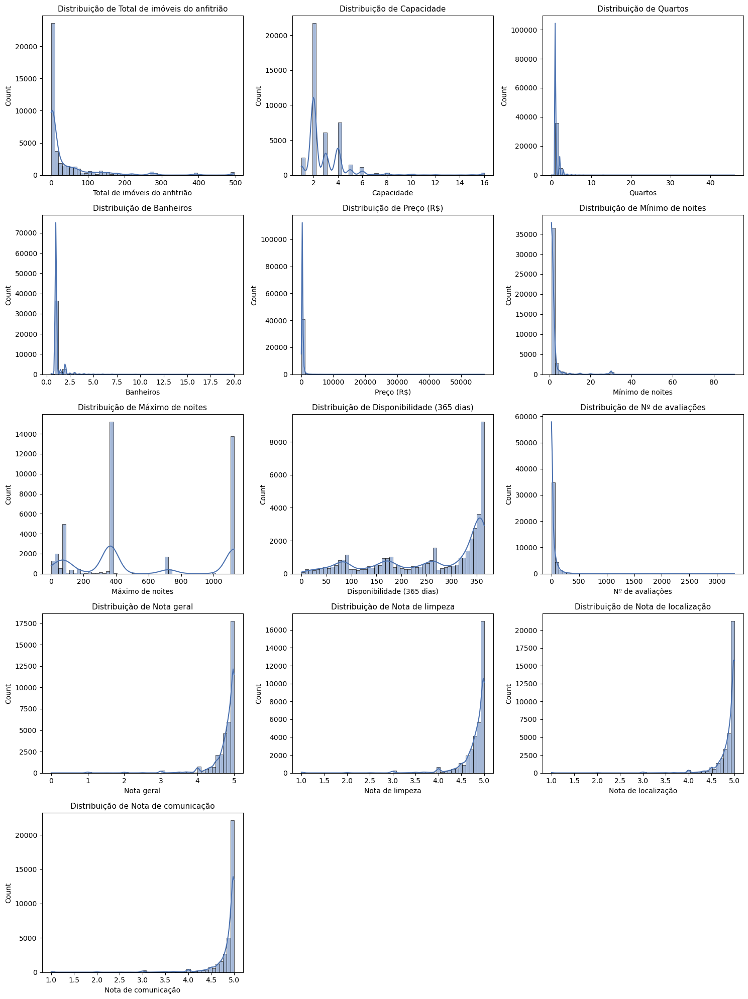

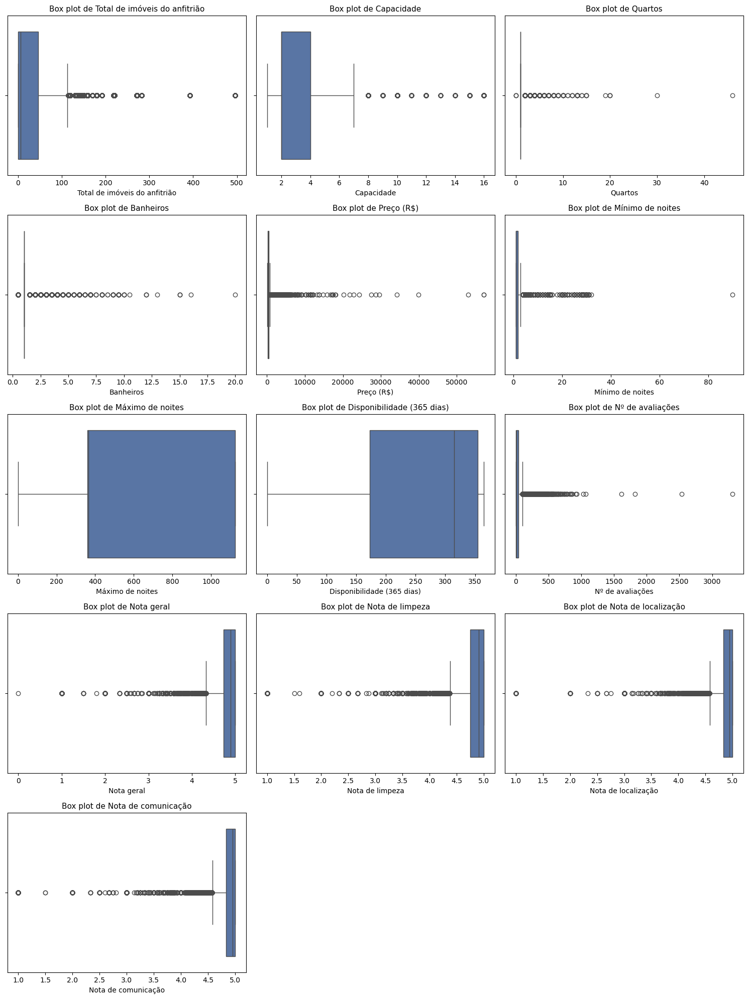

In [14]:
# Identificando as variáveis numéricas automaticamente
numericas = df.drop(columns=cols_excluir).select_dtypes(include='number').columns

# Calculando dinamicamente o número de linhas para um grid de 3 colunas
n_cols = 3
n_rows = (len(numericas) + n_cols - 1) // n_cols

# 1. Plotando os histogramas
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
axes = axes.flatten()

for i, var in enumerate(numericas):
    nome = labels.get(var, var)
    sns.histplot(df[var], bins=50, kde=True, ax=axes[i], color='#4C72B0')
    axes[i].set_title(f'Distribuição de {nome}', fontsize=11)
    axes[i].set_xlabel(nome)

# Ocultando os eixos vazios que sobrarem no final do grid
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# 2. Plotando os box plots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
axes = axes.flatten()

for i, var in enumerate(numericas):
    nome = labels.get(var, var)
    sns.boxplot(x=df[var], ax=axes[i], color='#4C72B0')
    axes[i].set_title(f'Box plot de {nome}', fontsize=11)
    axes[i].set_xlabel(nome)

# Ocultando os eixos vazios que sobrarem no final do grid
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### 3.1. Definição dos limites de corte (percentis)

Os histogramas e box plots confirmam que praticamente todas as variáveis numéricas apresentam distribuições assimétricas, com caudas longas e outliers visíveis. As mais extremas são `price` (até `R$ 57.127`), `bedrooms` (até 46) e `bathrooms` (até 20), mas `minimum_nights`, `maximum_nights`, `accommodates`, `number_of_reviews` e `calculated_host_listings_count` também têm pontos fora dos whiskers do box plot.

Variáveis com escala fechada — `availability_365` (0–365) e `review_scores_*` (0–5) — não precisam de corte, pois seus valores máximos são naturalmente limitados.

Em vez de definir cortes arbitrários, calculamos os percentis de todas as variáveis numéricas com range aberto de forma automática. Isso garante que nenhuma variável relevante fique sem diagnóstico e permite escolher limites que preservem a massa de dados legítima, removendo apenas a cauda extrema.

In [15]:
# Excluirndo colunas que não fazem sentido no diagnóstico
cols_excluir_p = ['id', 'host_id', 'latitude', 'longitude', 'availability_365', 'review_scores_rating']
numericas = df.drop(columns=cols_excluir_p).select_dtypes(include='number').columns

print("--- Percentis de todas as variáveis numéricas ---\n")
for col in numericas:
    nome = labels.get(col, col)
    print(f"{nome}:")
    for p in [90, 95, 97, 99, 99.5, 99.9]:
        val = df[col].quantile(p/100)
        if col == 'price':
            print(f"  {p}º: R$ {val:.2f}")
        else:
            print(f"  {p}º: {val:.1f}")
    print()

--- Percentis de todas as variáveis numéricas ---

Total de imóveis do anfitrião:
  90º: 131.0
  95º: 218.0
  97º: 272.0
  99º: 496.0
  99.5º: 496.0
  99.9º: 496.0

Capacidade:
  90º: 4.0
  95º: 6.0
  97º: 7.0
  99º: 14.0
  99.5º: 16.0
  99.9º: 16.0

Quartos:
  90º: 2.0
  95º: 2.0
  97º: 3.0
  99º: 4.0
  99.5º: 5.0
  99.9º: 9.0

Banheiros:
  90º: 1.5
  95º: 2.0
  97º: 2.5
  99º: 4.0
  99.5º: 5.0
  99.9º: 8.0

Preço (R$):
  90º: R$ 613.00
  95º: R$ 833.06
  97º: R$ 1055.75
  99º: R$ 1910.38
  99.5º: R$ 3081.95
  99.9º: R$ 9369.81

Mínimo de noites:
  90º: 3.0
  95º: 5.0
  97º: 10.0
  99º: 30.0
  99.5º: 30.0
  99.9º: 30.0

Máximo de noites:
  90º: 1125.0
  95º: 1125.0
  97º: 1125.0
  99º: 1125.0
  99.5º: 1125.0
  99.9º: 1125.0

Nº de avaliações:
  90º: 101.0
  95º: 152.0
  97º: 196.0
  99º: 306.0
  99.5º: 372.0
  99.9º: 589.1

Nota de limpeza:
  90º: 5.0
  95º: 5.0
  97º: 5.0
  99º: 5.0
  99.5º: 5.0
  99.9º: 5.0

Nota de localização:
  90º: 5.0
  95º: 5.0
  97º: 5.0
  99º: 5.0
  99.5º: 5

### 4. Tratamento de outliers

Com base nos percentis calculados, definimos os cortes para remover apenas a cauda extrema, preservando a massa de dados legítima:

| Variável | Corte (P99.5) | Justificativa |
|---|---|---|
| `price` | R$ 3.081,95 | Salto de R$ 1.910 (P99) para R$ 9.370 (P99.9); máximo de R$ 57.127 |
| `bedrooms` | 5 | Salto de 4 (P99) para 9 (P99.9); máximo de 46 |
| `bathrooms` | 5 | Salto de 4 (P99) para 8 (P99.9); máximo de 20 |

As demais variáveis não receberam corte:
- `minimum_nights`, `maximum_nights`, `accommodates`, `number_of_reviews` e `calculated_host_listings_count` têm caudas longas, mas os valores extremos são legítimos
- `availability_365` e `review_scores_*` têm escala fechada, sem possibilidade de outlier

In [16]:
# 4. Tratamento de outliers

# Registrando tamanho antes do corte
antes = df.shape[0]

# Cortes baseados no P99.5
df = df[df['price'] <= df['price'].quantile(0.995)]
df = df[df['bedrooms'] <= df['bedrooms'].quantile(0.995)]
df = df[df['bathrooms'] <= df['bathrooms'].quantile(0.995)]

depois = df.shape[0]
print(f"Entradas antes do corte: {antes}")
print(f"Entradas após o corte: {depois}")
print(f"Removidas: {antes - depois} ({(antes - depois) / antes * 100:.2f}%)")

Entradas antes do corte: 41821
Entradas após o corte: 41257
Removidas: 564 (1.35%)


### 4.1. Verificação dos cortes

Após a remoção dos outliers, repetimos a estatística descritiva, os histogramas e box plots das variáveis cortadas para confirmar que os extremos foram eliminados sem comprometer a distribuição central dos dados.

In [17]:
print("--- Estatísticas após remoção de outliers ---")
print(df[['price', 'bedrooms', 'bathrooms']].describe().T.round(2).to_string())

--- Estatísticas após remoção de outliers ---
             count    mean     std    min    25%    50%    75%     max
price      41257.0  376.77  248.35  11.53  250.0  330.0  426.0  3081.5
bedrooms   41257.0    1.16    0.45   0.00    1.0    1.0    1.0     4.0
bathrooms  41257.0    1.13    0.41   0.50    1.0    1.0    1.0     4.0


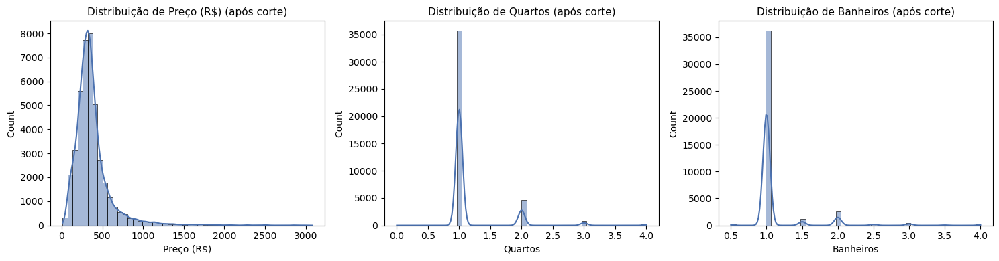

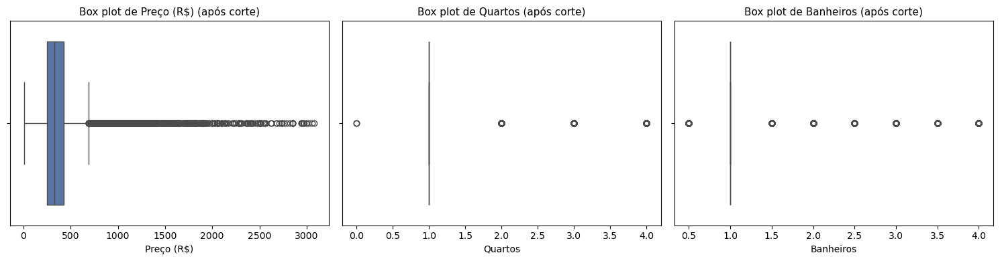

In [18]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, var in zip(axes, ['price', 'bedrooms', 'bathrooms']):
    sns.histplot(df[var], bins=50, kde=True, ax=ax, color='#4C72B0')
    ax.set_title(f'Distribuição de {labels[var]} (após corte)', fontsize=11)
    ax.set_xlabel(labels[var])
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, var in zip(axes, ['price', 'bedrooms', 'bathrooms']):
    sns.boxplot(x=df[var], ax=ax, color='#4C72B0')
    ax.set_title(f'Box plot de {labels[var]} (após corte)', fontsize=11)
    ax.set_xlabel(labels[var])
plt.tight_layout()
plt.show()

A estratégia de utilizar o percentil 99,5 como limite de corte demonstrou ser eficiente, removendo apenas 564 entradas (1,35% da base de dados). Conseguimos assim eliminar os valores extremos que causavam distorções estatísticas, preservando 98,65% dos dados reais, garantindo a fidelidade da análise ao mercado real de São Paulo.

### 5. Análise de variáveis categóricas

Com os outliers tratados, analisamos a distribuição das variáveis categóricas do dataset. O objetivo é entender a composição do mercado de *short-term rental*: quais tipos de acomodação dominam, como os anúncios se distribuem geograficamente e qual o perfil dos anfitriões. Além da frequência absoluta, calculamos a proporção de cada categoria com `value_counts(normalize=True)` para facilitar a comparação.

As variáveis categóricas disponíveis são: `room_type`, `neighbourhood_cleansed`, `host_is_superhost` e `host_identity_verified`. A variável `amenities` será analisada separadamente por conter listas de itens que exigem tratamento específico.

In [19]:
# 5.1 Tipo de quarto
print("--- Tipo de quarto ---")
vc = traduzir_serie(df['room_type'], 'room_type').value_counts().rename_axis('Tipo de quarto')
print(vc)
print("\nProporção:")
vc_pct = (traduzir_serie(df['room_type'], 'room_type').value_counts(normalize=True) * 100).round(2).rename_axis('Tipo de quarto')
print(vc_pct)

--- Tipo de quarto ---
Tipo de quarto
Casa/apto inteiro       35588
Quarto privado           5389
Quarto compartilhado      245
Quarto de hotel            35
Name: count, dtype: int64

Proporção:
Tipo de quarto
Casa/apto inteiro       86.26
Quarto privado          13.06
Quarto compartilhado     0.59
Quarto de hotel          0.08
Name: proportion, dtype: float64


In [20]:
# 5.2 Bairros com mais anúncios (top 15)
print("\n--- Bairros com mais anúncios (top 15) ---")
print(df['neighbourhood_cleansed'].value_counts().head(15).rename_axis('Bairro'))
print("\nProporção (top 15):")
print((df['neighbourhood_cleansed'].value_counts(normalize=True).head(15) * 100).round(2).rename_axis('Bairro'))


--- Bairros com mais anúncios (top 15) ---
Bairro
Itaim Bibi         4323
Republica          3636
Jardim Paulista    3421
Moema              2829
Pinheiros          2792
Vila Mariana       2679
Bela Vista         2378
Perdizes           1941
Consolacao         1896
Santo Amaro        1815
Campo Belo         1374
Bras                833
Saude               787
Santa Cecilia       723
Liberdade           682
Name: count, dtype: int64

Proporção (top 15):
Bairro
Itaim Bibi         10.48
Republica           8.81
Jardim Paulista     8.29
Moema               6.86
Pinheiros           6.77
Vila Mariana        6.49
Bela Vista          5.76
Perdizes            4.70
Consolacao          4.60
Santo Amaro         4.40
Campo Belo          3.33
Bras                2.02
Saude               1.91
Santa Cecilia       1.75
Liberdade           1.65
Name: proportion, dtype: float64


In [21]:
# 5.3 Superhost
print("\n--- Superhost ---")
vc = traduzir_serie(df['host_is_superhost'], 'host_is_superhost').value_counts().rename_axis('Superhost')
print(vc)
print("\nProporção:")
vc_pct = (traduzir_serie(df['host_is_superhost'], 'host_is_superhost').value_counts(normalize=True) * 100).round(2).rename_axis('Superhost')
print(vc_pct)


--- Superhost ---
Superhost
Não    20892
Sim    20365
Name: count, dtype: int64

Proporção:
Superhost
Não    50.64
Sim    49.36
Name: proportion, dtype: float64


In [22]:
# 5.4 Identidade verificada
print("\n--- Identidade verificada ---")
vc = traduzir_serie(df['host_identity_verified'], 'host_identity_verified').value_counts().rename_axis('Identidade verificada')
print(vc)
print("\nProporção:")
vc_pct = (traduzir_serie(df['host_identity_verified'], 'host_identity_verified').value_counts(normalize=True) * 100).round(2).rename_axis('Identidade verificada')
print(vc_pct)


--- Identidade verificada ---
Identidade verificada
Sim    40090
Não     1167
Name: count, dtype: int64

Proporção:
Identidade verificada
Sim    97.17
Não     2.83
Name: proportion, dtype: float64


In [23]:
# 5.5 Preço médio por tipo de quarto
print("\n--- Preço médio por tipo de quarto ---")
df_temp = df.copy()
df_temp['room_type'] = traduzir_serie(df['room_type'], 'room_type')
print(df_temp.groupby('room_type')['price'].agg(['mean', 'median', 'count']).round(2).rename_axis('Tipo de quarto'))


--- Preço médio por tipo de quarto ---
                        mean  median  count
Tipo de quarto                             
Casa/apto inteiro     396.64   343.0  35588
Quarto compartilhado  132.16    91.0    245
Quarto de hotel       587.91   371.0     35
Quarto privado        255.35   183.0   5389


In [24]:
# 5.6 Top 10 bairros por preço médio
print("\n--- Top 10 bairros por preço médio ---")
print(df.groupby('neighbourhood_cleansed')['price'].mean().sort_values(ascending=False).head(10).round(2).rename_axis('Bairro'))


--- Top 10 bairros por preço médio ---
Bairro
Cidade Tiradentes    1214.65
Marsilac              794.44
Jardim Helena         755.25
Parelheiros           723.16
Grajau                716.00
Iguatemi              689.44
Cidade Dutra          674.65
Socorro               643.15
Artur Alvim           599.39
Vila Curuca           550.33
Name: price, dtype: float64


### 6. Matriz de correlação

Para identificar relações entre as variáveis numéricas do dataset, calculamos a matriz de correlação de Pearson. O objetivo é descobrir quais variáveis estão mais associadas ao preço e entre si, gerando insights para etapas futuras de modelagem ou análise exploratória mais aprofundada. Excluímos variáveis de identificação (`id`, `host_id`) e coordenadas geográficas (`latitude`, `longitude`), que não fazem sentido nesse contexto. Os resultados são visualizados em um mapa de calor (*heatmap*) para facilitar a identificação de correlações fortes (positivas ou negativas).

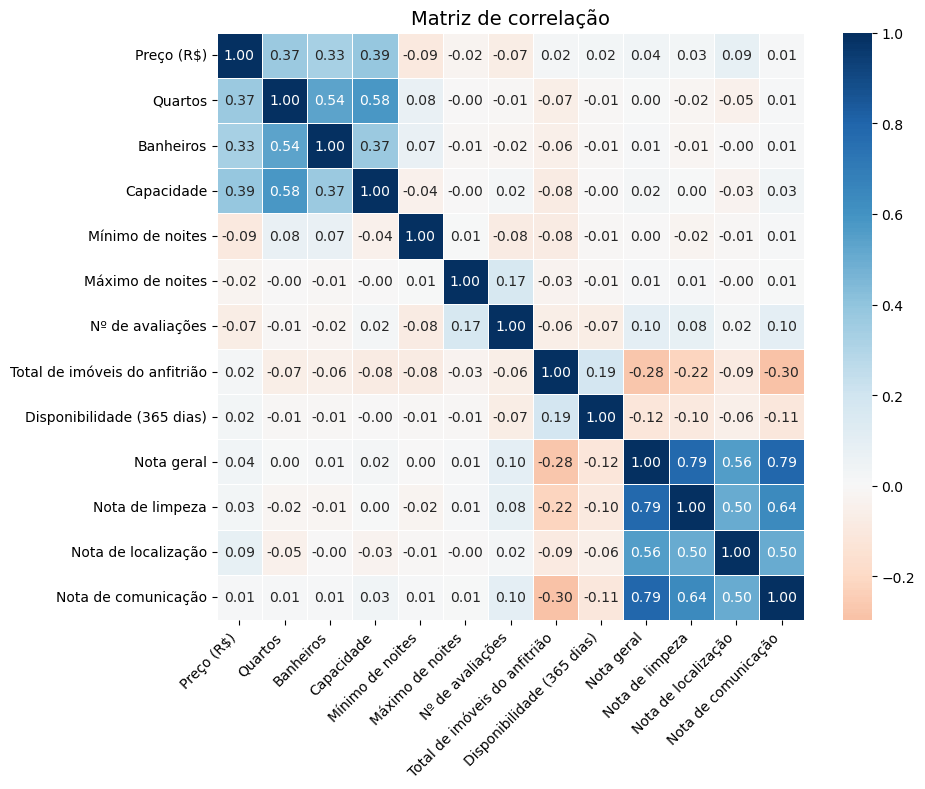

In [25]:
# 6. Matriz de correlação

# Selecionando variáveis numéricas relevantes
cols_corr = ['price', 'bedrooms', 'bathrooms', 'accommodates', 'minimum_nights',
             'maximum_nights', 'number_of_reviews', 'calculated_host_listings_count',
             'availability_365', 'review_scores_rating', 'review_scores_cleanliness',
             'review_scores_location', 'review_scores_communication']

# Calculando a correlação
corr = df[cols_corr].corr()

# Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, fmt='.2f', cmap='RdBu', center=0,
            square=True, linewidths=0.5,
            xticklabels=[labels.get(c, c) for c in cols_corr],
            yticklabels=[labels.get(c, c) for c in cols_corr])
plt.title('Matriz de correlação', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [26]:
# Top correlações com preço
print("--- Correlações com Preço ---")
corr_preco = corr['price'].drop('price').sort_values(ascending=False)
corr_preco.index = [labels.get(idx, idx) for idx in corr_preco.index]
print(corr_preco.round(3))

--- Correlações com Preço ---
Capacidade                       0.386
Quartos                          0.372
Banheiros                        0.328
Nota de localização              0.088
Nota geral                       0.035
Nota de limpeza                  0.031
Disponibilidade (365 dias)       0.025
Total de imóveis do anfitrião    0.023
Nota de comunicação              0.011
Máximo de noites                -0.025
Nº de avaliações                -0.073
Mínimo de noites                -0.094
Name: price, dtype: float64


#### Principais observações

- **Capacidade × Quartos (0,73) e Capacidade × Banheiros (0,69)**: correlação forte e esperada, imóveis com mais quartos e banheiros podem acomodar mais pessoas.

- **Preço × Capacidade (0,39), Preço × Quartos (0,37) e Preço × Banheiros (0,33)**: correlação fraca. O tamanho do imóvel tem alguma influência sobre o preço, mas sozinho explica pouco da variância. A Capacidade, variável mais correlacionada, responde por apenas ~15% da variação de preço. Fatores não capturados nessas variáveis estruturais (localização, tipo de quarto, amenities) devem pesar mais na precificação.

- **Cluster de notas de avaliação**: as quatro notas (geral, limpeza, localização e comunicação) apresentam correlações altas entre si (0,60 a 0,79), indicando que hóspedes satisfeitos com um aspecto tendem a avaliar bem todos os outros aspectos.

- **Total de imóveis do anfitrião × Notas (–0,09 a –0,30)**: correlação negativa fraca, mas consistente — anfitriões com mais imóveis tendem a receber avaliações ligeiramente piores, sugerindo dificuldade em manter a qualidade com a escala. A exceção é a nota de localização (–0,09), praticamente nula — faz sentido, pois a localização é atributo do imóvel, não do anfitrião.

- **Preço × Notas de avaliação (0,01 a 0,09)**: correlação praticamente nula — pagar mais não garante melhor experiência avaliada pelos hóspedes.

- **Nº de avaliações × Notas (0,02 a 0,10)**: correlação praticamente nula e positiva Imóveis com mais avaliações têm notas levemente mais altas, possivelmente porque anfitriões mais experientes deliveram melhor experiência.

### 7. Análise geográfica

Com as coordenadas geográficas de cada imóvel, podemos visualizar a distribuição espacial dos anúncios na cidade de São Paulo e identificar padrões de concentração e variação de preço por região. Primeiramente, vamos validar se as coordenadas estão dentro de um intervalo geograficamente plausível para o município (latitudes entre -24 e -23, longitudes entre -47 e -46).

In [27]:
# 7. Análise geográfica

# 7.1 Validação das coordenadas
print("--- Validação de coordenadas ---")
lat_valida = df['latitude'].between(-24, -23).sum()
lon_valida = df['longitude'].between(-47, -46).sum()
print(f"Latitudes válidas: {lat_valida} de {len(df)} ({lat_valida/len(df)*100:.1f}%)")
print(f"Longitudes válidas: {lon_valida} de {len(df)} ({lon_valida/len(df)*100:.1f}%)")

--- Validação de coordenadas ---
Latitudes válidas: 41257 de 41257 (100.0%)
Longitudes válidas: 41257 de 41257 (100.0%)


 Validamos que todos os imóveis estão localizados dentro do intervalo esperado. Então, geramos um *scatter plot* com a localização de cada imóvel colorida pelo preço, permitindo identificar visualmente as zonas mais caras e mais baratas da cidade. 

In [28]:
# 7.2 Scatter plot geográfico colorido por preço
fig = px.scatter_map(df, lat='latitude', lon='longitude', color='price',
                     color_continuous_scale='Spectral_r',
                     size_max=10, opacity=0.5,
                     map_style='carto-positron',
                     labels={'price': labels['price']},
                     title='Distribuição geográfica dos anúncios por preço')

# Centralizar título
fig.update_layout(title_x=0.5)

# Fit automático nos dados + zoom controlado
fig.update_layout(map=dict(
    center=dict(lat=-23.58, lon=-46.65),
    zoom=10
))

fig.update_traces(marker=dict(size=4))
fig.update_layout(margin=dict(l=0, r=0, t=50, b=0), height=700)

fig.show()

A visualização foi construída sobre um mapa base da cidade de São Paulo para fornecer contexto geográfico às coordenadas dos imóveis. O mapa é interativo — é possível aplicar zoom, deslocar a visualização e obter informações individuais de cada ponto, incluindo latitude, longitude e preço.

Por fim, comparamos os preços médios por bairro com o número de anúncios para validar se os bairros com maior preço médio realmente representam o mercado ou se são distorcidos por poucos anúncios.

In [29]:
# 7.3 Top 10 bairros por preço médio vs. número de anúncios
print("\n--- Top 10 bairros por preço médio (com nº de anúncios) ---")
bairro_stats = df.groupby('neighbourhood_cleansed')['price'].agg(['mean', 'count']).round(2)
bairro_stats = bairro_stats.sort_values('mean', ascending=False).head(10)
bairro_stats.index = bairro_stats.index.rename('Bairro')
bairro_stats.columns = ['Preço médio (R$)', 'Nº de anúncios']
print(bairro_stats)

# 7.4 Top 10 bairros com mais anúncios e seus preços médios
print("\n--- Top 10 bairros com mais anúncios (e seus preços médios) ---")
bairro_top = df.groupby('neighbourhood_cleansed')['price'].agg(['mean', 'count']).round(2)
bairro_top = bairro_top.sort_values('count', ascending=False).head(10)
bairro_top.index = bairro_top.index.rename('Bairro')
bairro_top.columns = ['Preço médio (R$)', 'Nº de anúncios']
print(bairro_top)


--- Top 10 bairros por preço médio (com nº de anúncios) ---
                   Preço médio (R$)  Nº de anúncios
Bairro                                             
Cidade Tiradentes           1214.65               6
Marsilac                     794.44              13
Jardim Helena                755.25              16
Parelheiros                  723.16              50
Grajau                       716.00              40
Iguatemi                     689.44               2
Cidade Dutra                 674.65             177
Socorro                      643.15             136
Artur Alvim                  599.39              38
Vila Curuca                  550.33              11

--- Top 10 bairros com mais anúncios (e seus preços médios) ---
                 Preço médio (R$)  Nº de anúncios
Bairro                                           
Itaim Bibi                 483.81            4323
Republica                  296.89            3636
Jardim Paulista            445.43            3421


#### Principais observações

- A grande maioria dos anúncios está concentrada na região centro-oeste de São Paulo, com maior densidade em bairros como Itaim Bibi, República, Jardim Paulista, Moema e Pinheiros. A periferia apresenta uma oferta significativamente menor.

- **Viés de amostragem**: O ranking de bairros mais caros é estatisticamente enganoso. Cidade Tiradentes (R$ 1.215, apenas 6 anúncios), Marsilac (R$ 794, 13 anúncios) e Jardim Helena (R$ 755, 16 anúncios) são regiões periféricas com volume insuficiente de observações, o que infla a média. Isso é impulsionado por propriedades atípicas, como chácaras e sítios, não refletindo o mercado padrão de hospedagem.

- **Mercado real**: Ao focarmos em bairros com mais anúncios, o comportamento de precificação se torna mais representativo. Áreas nobres lideram os valores: Itaim Bibi (R$ 484, 4.323 anúncios), Jardim Paulista (R$ 445, 3.421) e Moema (R$ 410, 2.829). Em contrapartida, a República apresenta a menor média entre os mais populares (R$ 297, 3.636 anúncios), provavelmente devido à alta concentração de studios e kitnets no centro.

- **Padrões de distribuição espacial do preço**: O mapa evidencia a formação de clusters de alto valor (tons quentes) no eixo sudoeste — Itaim, Moema e Pinheiros — e em áreas seletas do centro expandido. Nas zonas periféricas, predominam diárias mais acessíveis (tons frios), com pontos isolados de preço elevado que correspondem a propriedades rurais ou de grande porte.

- **Conclusão**: Analisar preço médio agrupado por bairro sem ponderar o volume da amostra gera conclusões distorcidas. A representatividade estatística, medida pelo número de anúncios, deve sempre validar as comparações de precificação entre regiões.

### 8. Análise de preço por tipo de acomodação

O dataset classifica os anúncios em quatro tipos de acomodação: casa/apartamento inteiro, quarto privado, quarto compartilhado e quarto de hotel. Esta análise examina como o tipo de acomodação influencia o preço da diária e qual é a representatividade de cada categoria no mercado de São Paulo.

In [30]:
# 8. Análise de preço por tipo de acomodação

# 8.1 Distribuição e preço médio por tipo de acomodação
print("--- Preço médio por tipo de acomodação ---")
room_stats = df.groupby('room_type')['price'].agg(['mean', 'median', 'count']).round(2)
room_stats = room_stats.sort_values('mean', ascending=False)
room_stats.index = [labels.get(idx, idx) for idx in room_stats.index]
room_stats.index = room_stats.index.rename('Tipo de quarto')
room_stats.columns = ['Preço médio (R$)', 'Mediana (R$)', 'Nº de anúncios']
room_stats['% do total'] = (room_stats['Nº de anúncios'] / len(df) * 100).round(1)

pd.set_option('display.width', 200)
pd.set_option('display.max_columns', 10)
print(room_stats)

--- Preço médio por tipo de acomodação ---
                 Preço médio (R$)  Mediana (R$)  Nº de anúncios  % do total
Tipo de quarto                                                             
Hotel room                 587.91         371.0              35         0.1
Entire home/apt            396.64         343.0           35588        86.3
Private room               255.35         183.0            5389        13.1
Shared room                132.16          91.0             245         0.6


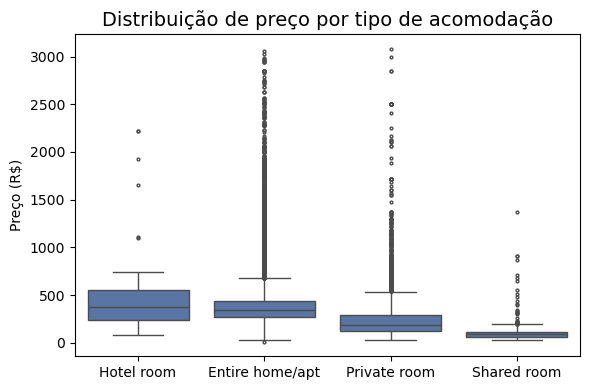

In [31]:
# 8.2 Box plot de preço por tipo de acomodação
fig, ax = plt.subplots(figsize=(6, 4))
ordem = df.groupby('room_type')['price'].median().sort_values(ascending=False).index
palette_azul = {rt: '#4C72B0' for rt in ordem}
sns.boxplot(data=df, x='room_type', y='price', order=ordem, ax=ax,
            hue='room_type', palette=palette_azul, legend=False, fliersize=2)
from matplotlib.ticker import FixedLocator
ax.xaxis.set_major_locator(FixedLocator(range(len(ordem))))
ax.set_xticklabels([labels.get(t, t) for t in ordem], rotation=0, ha='center')
ax.set_ylabel(labels['price'])
ax.set_xlabel('')
ax.set_title('Distribuição de preço por tipo de acomodação', fontsize=14)
plt.tight_layout()
plt.show()

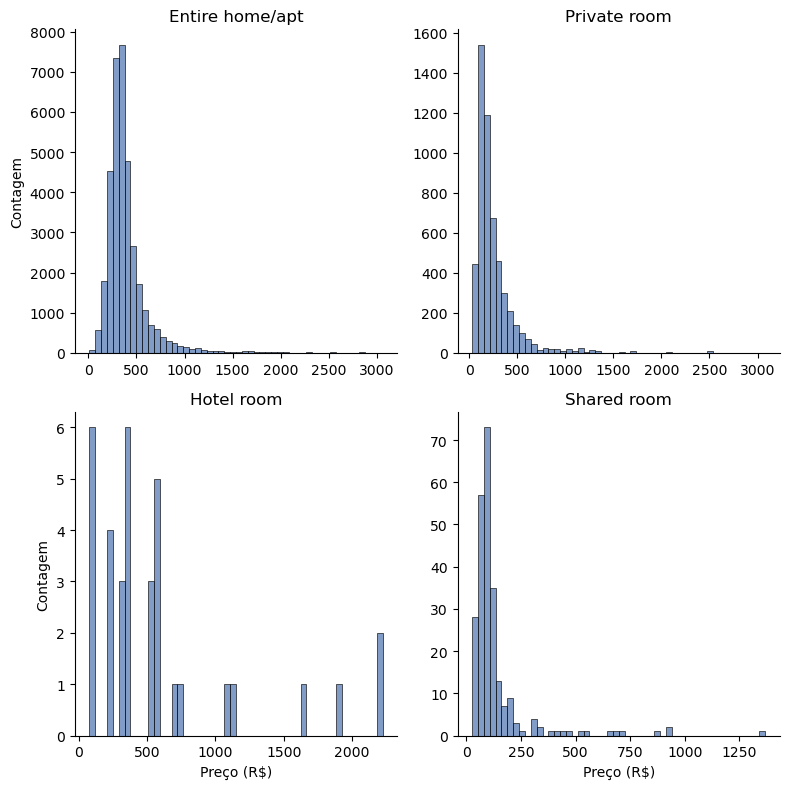

In [32]:
# 8.3 Histograma de preço por tipo (facetado)
g = sns.FacetGrid(df, col='room_type', col_wrap=2, height=4, sharex=False, sharey=False)
g.map_dataframe(sns.histplot, x='price', bins=50, color='#4C72B0', alpha=0.7)
g.set_axis_labels(labels['price'], 'Contagem')
for ax in g.axes.flatten():
    titulo = ax.get_title().replace('room_type = ', '')
    ax.set_title(labels.get(titulo, titulo))
plt.tight_layout()
plt.show()

#### Principais observações

- Há um domínio de casas e apartamentos inteiros, com esta classe representando 86,3% do mercado com 35.588 anúncios, preço médio de R$ 396 e mediana de R$ 343. Essa categoria é o coração do mercado de *short-rental* na cidade.

- **Preço médio**: quartos de hotel apresentam o maior preço médio, mas amostra irrisória. Esta classe apresenta um preço médio de R$ 588, porém existem apenas 35 anúncios, representando 0,1% do total, o que pode ser devido a esse tipo de anúncio ser algo relativamente novo na plataforma. O valor é variável e não representativo, qualquer conclusão sobre essa categoria é especulativa.

- **Alternativa mais econômica**: quartos privados são uma alternativa econômica, representando 13,1% do mercado (5.389 anúncios), com preço médio de R$ 255 e mediana de R$ 183. A diferença entre média e mediana (R$ 72) se deve a poucos imóveis de luxo que elevam a média.

- **Quartos compartilhados**: essa classe apresenta baixa representatividade com apenas 245 anúncios (0,6%), sendo praticamente inexpressivos no mercado paulistano e apresentando a menor média (R$ 132) e mediana (R$ 91). 

- **Discrepância entre média e mediana**: em todas as categorias, a média é significativamente maior do que a mediana, sendo a mediana a medida mais adequada para descrever o preço típico.

- **Hierarquia de precificação**: mesmo usando a mediana, a ordem se mantém, temos hotel (R$ 371), seguido por casa/apto inteiro (R$ 343), seguido por quarto privado (R$ 183) e quarto compartilhado (R$ 91). O ágio de quase 90% na mediana entre quartos privados e casas inteiras (uma diferença de R$ 160) evidencia que a exclusividade do imóvel é o atributo de maior peso na composição do preço.

### 9. Análise de Superhost vs. Anfitrião comum

O selo de Superhost é concedido pela plataforma a anfitriões que mantêm critérios de excelência em avaliação, frequência de hospedagens e taxa de cancelamento. Esta seção investiga se o selo se traduz em diferenças de preço, volume de avaliações e qualidade percebida.

In [33]:
# 9. Análise de superhost vs. anfitrião comum

# 9.1 Distribuição geral
print("--- Distribuição de Superhost ---")
superhost_count = df['host_is_superhost'].value_counts()
print(superhost_count)
print(f"\nSuperhosts: {superhost_count.get(True, 0)} ({superhost_count.get(True, 0)/len(df)*100:.1f}%)")
print(f"Anfitriões comuns: {superhost_count.get(False, 0)} ({superhost_count.get(False, 0)/len(df)*100:.1f}%)")



--- Distribuição de Superhost ---
host_is_superhost
False    20892
True     20365
Name: count, dtype: int64

Superhosts: 20365 (49.4%)
Anfitriões comuns: 20892 (50.6%)


In [34]:
# 9.2 Comparação de preço e avaliações
print("\n--- Comparação de métricas ---")
superhost_stats = df.groupby('host_is_superhost').agg({
    'price': ['mean', 'median'],
    'number_of_reviews': 'mean',
    'review_scores_rating': 'mean',
    'review_scores_cleanliness': 'mean',
    'review_scores_location': 'mean',
    'review_scores_communication': 'mean',
    'availability_365': 'mean'
}).round(2)

superhost_stats.index = ['Anfitrião comum', 'Superhost']
superhost_stats.columns = ['Preço médio (R$)', 'Mediana preço (R$)', 'Média de avaliações',
                          'Nota geral', 'Nota limpeza', 'Nota localização', 'Nota comunicação',
                          'Disponibilidade (dias)']
print(superhost_stats.T)


--- Comparação de métricas ---
                        Anfitrião comum  Superhost
Preço médio (R$)                 383.72     369.65
Mediana preço (R$)               330.00     330.94
Média de avaliações               22.90      53.00
Nota geral                         4.66       4.88
Nota limpeza                       4.69       4.88
Nota localização                   4.82       4.90
Nota comunicação                   4.74       4.92
Disponibilidade (dias)           276.34     245.14


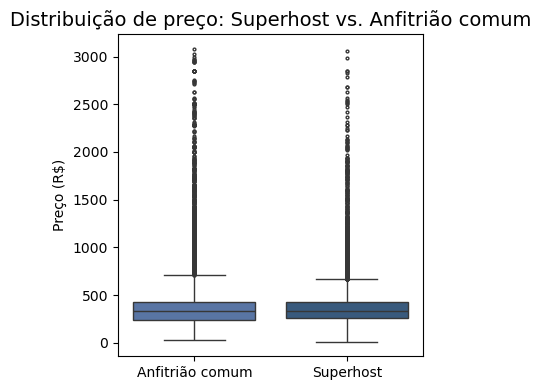

In [35]:
# 9.3 Box plot de preço: Superhost vs Comum
fig, ax = plt.subplots(figsize=(4, 4))
palette_azul = {False: '#4C72B0', True: '#2E5A88'}
sns.boxplot(data=df, x='host_is_superhost', y='price', ax=ax,
            hue='host_is_superhost', palette=palette_azul, legend=False, fliersize=2)
from matplotlib.ticker import FixedLocator
ax.xaxis.set_major_locator(FixedLocator([0, 1]))
ax.set_xticklabels(['Anfitrião comum', 'Superhost'], rotation=0)
ax.set_ylabel(labels['price'])
ax.set_xlabel('')
ax.set_title('Distribuição de preço: Superhost vs. Anfitrião comum', fontsize=14)
plt.tight_layout()
plt.show()

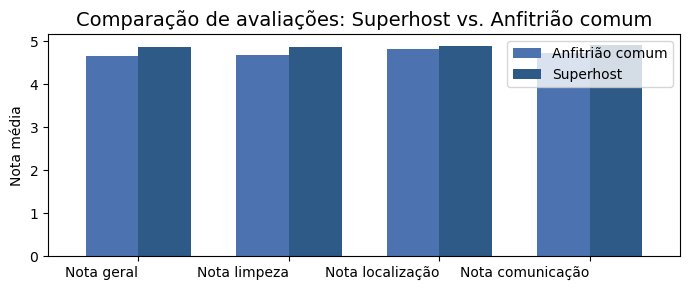

In [36]:
# 9.4 Gráfico de barras comparando notas
notas_cols = ['review_scores_rating', 'review_scores_cleanliness', 
              'review_scores_location', 'review_scores_communication']
notas_labels = ['Nota geral', 'Nota limpeza', 'Nota localização', 'Nota comunicação']

notas_comp = df.groupby('host_is_superhost')[notas_cols].mean().T
notas_comp.columns = ['Anfitrião comum', 'Superhost']
notas_comp.index = notas_labels

fig, ax = plt.subplots(figsize=(7, 3))
notas_comp.plot(kind='bar', ax=ax, color=['#4C72B0', '#2E5A88'], width=0.7)
ax.set_ylabel('Nota média')
ax.set_xlabel('')
ax.set_title('Comparação de avaliações: Superhost vs. Anfitrião comum', fontsize=14)
ax.set_xticklabels(notas_labels, rotation=0, ha='right')
ax.legend(title='')
plt.tight_layout()
plt.show()

#### Principais observações

Temos uma distribuição equilibrada entre Superhosts (20365) e anfitriões comuns (20892), demonstrando que esse selo é comum no mercado paulistano, com quase metade dos anúncios cumprindo os critérios da plataforma (49.4%).

- **Preço médio**: o preço médio de Superhosts (R$ 370) é ligeiramente inferior ao de anfitriões comuns (R$ 384), com as medianas sendo praticamente idênticas (superhost sendo 0,94 centavos mais caro). O box plot confirma distribuições sobrepostas, demonstrando que o selo não é usado como justificativa para precificação superior.

- **Quantidade de avaliações**: Superhosts recebem mais que o dobro de avaliações, apresentando uma média de 53 avaliações contra 23 de anfitriões comuns. Isso indica maior rotatividade de hóspedes e mais experiência operacional. O selo exige um número mínimo de hospedagens por ano, o que se reflete diretamente no volume acumulado.

- **Notas**: Superhosts apresentam notas superiores a de anfitriões comuns em todas as dimensões avaliadas. A maior diferença está em nota geral (diferença de 0,22 pontos), seguida por limpeza (diferença de 0,19 pontos) e comunicação (diferença de 0,18 pontos). A localização apresenta a menor diferença (0,08 pontos), o que faz sentido, uma vez que a localização é atributo do imóvel, não do anfitrião.

- **Taxa de ocupação**: Superhosts apresentam menor disponibilidade, 245 dias disponíveis em média contra 276 de anfitriões comuns. A maior taxa de ocupação é coerente com o maior volume de avaliações e confirma que o selo está associado a maior demanda e não ao maior preço.

- **Perfil do Superhost**: mais experiência, mais hóspedes, melhores avaliações e maior ocupação, mas preço similar. O selo funciona como sinal de qualidade para o hóspede e como critério de diferenciação competitiva entre anfitriões, sem gerar prêmio por preço. A vantagem do Superhost está no volume, não na margem de lucro.

### 10. Análise de disponibilidade

A variável `availability_365` representa quantos dias o anúncio está disponível para reserva nos próximos 365 dias. Esta análise investiga como a disponibilidade se distribui no mercado paulistano e se varia conforme o tipo de acomodação.

In [37]:
# 10. ANÁLISE DE DISPONIBILIDADE

# 10.1 Estatísticas gerais
print("--- Estatísticas de disponibilidade (365 dias) ---")
print(df['availability_365'].describe().round(2))

# 10.2 Categorias de disponibilidade
bins = [-1, 0, 90, 180, 270, 365]
labels_disp = ['Indisponível', '0-90 dias', '91-180 dias', '181-270 dias', '271-365 dias']
df['availability_cat'] = pd.cut(df['availability_365'], bins=bins, labels=labels_disp)

print("\n--- Distribuição por categoria ---")
disp_count = df['availability_cat'].value_counts().sort_index()
disp_pct = (disp_count / len(df) * 100).round(1)
disp_table = pd.DataFrame({'Nº de anúncios': disp_count, '% do total': disp_pct})
disp_table.index.name = 'Categoria de disponibilidade'
print(disp_table)

--- Estatísticas de disponibilidade (365 dias) ---
count    41257.00
mean       260.94
std        108.62
min          0.00
25%        173.00
50%        314.00
75%        355.00
max        365.00
Name: availability_365, dtype: float64

--- Distribuição por categoria ---
                              Nº de anúncios  % do total
Categoria de disponibilidade                            
Indisponível                               2         0.0
0-90 dias                               5614        13.6
91-180 dias                             5923        14.4
181-270 dias                            6674        16.2
271-365 dias                           23044        55.9


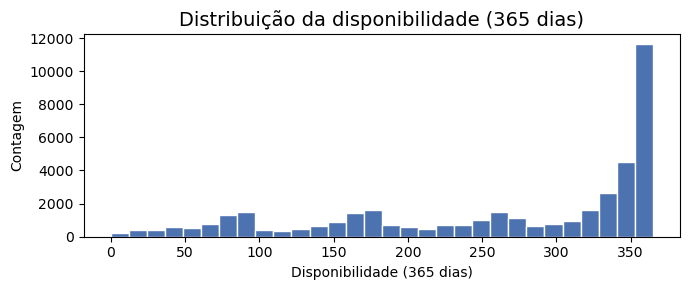

In [38]:
# 10.3 Histograma de disponibilidade
fig, ax = plt.subplots(figsize=(7, 3))
ax.hist(df['availability_365'], bins=30, color='#4C72B0', edgecolor='white')
ax.set_xlabel(labels['availability_365'])
ax.set_ylabel('Contagem')
ax.set_title('Distribuição da disponibilidade (365 dias)', fontsize=14)
plt.tight_layout()
plt.show()

In [39]:
# 10.4 Disponibilidade por tipo de quarto
print("\n--- Disponibilidade média por tipo de quarto ---")
disp_room = df.groupby('room_type', observed=True)['availability_365'].mean().round(1)
disp_room.index = [labels.get(r, r) for r in disp_room.index]
disp_room = disp_room.sort_values(ascending=False)
print(disp_room)


--- Disponibilidade média por tipo de quarto ---
Shared room        304.7
Private room       264.5
Hotel room         260.4
Entire home/apt    260.1
Name: availability_365, dtype: float64


#### Principais observações

Temos uma alta disponibilidade predominante no mercado, com a mediana de 314 dias (86% do ano) e média de 261 dias (71,5%). A maioria dos anúncios (55,9%) está disponível entre 271-365 dias por ano, indicando que a maior parte do mercado mantém calendários abertos na maior parte do tempo.

- **Distribuição assimétrica**: a mediana (314) é superior à média (261), indicando concentração nos valores altos, com uma cauda de anúncios com baixa disponibilidade puxando a média para baixo. O histograma confirma essa concentração no extremo direito.

- **Baixa disponibilidade é minoria**: apenas 13,6% dos anúncios estão disponíveis 0-90 dias e 14,4% entre 91-180 dias. Somadas, as duas faixas de menor disponibilidade representam 28% do mercado. Apenas 2 anúncios estão completamente indisponíveis — número desprezível.

- **Disponibilidade por tipo de acomodação**: quartos compartilhados lideram com 305 dias disponíveis em média, contra ~260 dias para os demais tipos (casa/apto inteiro, quarto privado e quarto de hotel, com valores praticamente iguais). A maior disponibilidade de quartos compartilhados pode refletir menor demanda por esse tipo de acomodação — anfitriões mantêm calendários abertos por mais tempo aguardando reservas.

- **Interpretação da alta disponibilidade**: a alta disponibilidade não significa necessariamente baixa demanda. Pode refletir anfitriões que mantêm calendários abertos para futuras reservas, anúncios novos sem reservas ainda, ou imóveis com baixa taxa de ocupação real. Sem dados de ocupação efetiva, não é possível distinguir entre essas causas.

### 11. Análise temporal

A variável `last_review` registra a data da última avaliação recebida por cada anúncio. Esta análise investiga a distribuição temporal das avaliações no mercado paulistano. Vale ressaltar que essa variável captura apenas a data mais recente de avaliação por anúncio, não o volume total de avaliações ao longo do tempo.

In [40]:
# 11. Análise temporal

# 11.1 Converter last_review para datetime
df['last_review'] = pd.to_datetime(df['last_review'], errors='coerce')

# 11.2 Estatísticas gerais
print("--- Estatísticas de última avaliação ---")
tem_review = df['last_review'].notna()
print(f"Anúncios com avaliação: {tem_review.sum()} ({tem_review.sum()/len(df)*100:.1f}%)")
print(f"Anúncios sem avaliação: {(~tem_review).sum()} ({(~tem_review).sum()/len(df)*100:.1f}%)")
print(f"Data mais antiga: {df.loc[tem_review, 'last_review'].min().strftime('%Y-%m-%d')}")
print(f"Data mais recente: {df.loc[tem_review, 'last_review'].max().strftime('%Y-%m-%d')}")

--- Estatísticas de última avaliação ---
Anúncios com avaliação: 35945 (87.1%)
Anúncios sem avaliação: 5312 (12.9%)
Data mais antiga: 2013-10-13
Data mais recente: 2026-06-16


In [41]:
# 11.3 Distribuição por ano
print("\n--- Distribuição por ano ---")
df_reviewed = df[tem_review].copy()
df_reviewed['review_year'] = df_reviewed['last_review'].dt.year
year_counts = df_reviewed['review_year'].value_counts().sort_index()
print(year_counts)


--- Distribuição por ano ---
review_year
2013        3
2014        5
2015        8
2016       10
2017       28
2018       36
2019       93
2020       79
2021       96
2022      214
2023      459
2024      926
2025     3551
2026    30437
Name: count, dtype: int64


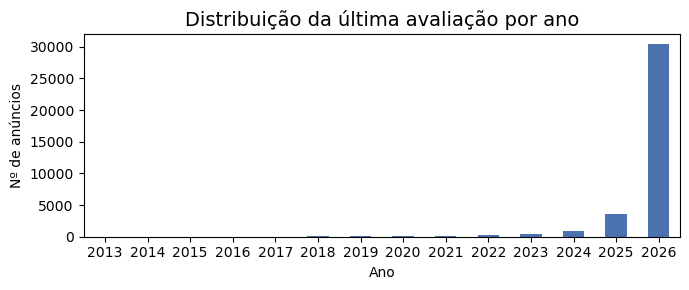

In [42]:
# 11.5 Gráfico - avaliações por ano
fig, ax = plt.subplots(figsize=(7, 3))
year_counts.plot(kind='bar', ax=ax, color='#4C72B0')
ax.set_xlabel('Ano')
ax.set_ylabel('Nº de anúncios')
ax.set_title('Distribuição da última avaliação por ano', fontsize=14)
ax.tick_params(axis='x', rotation=0)
plt.tight_layout()
plt.show()

#### Principais observações

Temos 87,1% dos anúncios com pelo menos uma avaliação (35.945) e 12,9% sem avaliação alguma (5.312), indicando que a grande maioria dos imóveis já recebeu hóspedes. Os anúncios sem avaliação podem ser novos ou inativos.

- **Concentração recente massiva**: a distribuição por ano é extremamente assimétrica, com 2026 concentrando 30.437 anúncios (84,7% dos revisados) e 2025 com 3.551 (9,9%). Juntos, os dois anos mais recentes representam 94,6% do total. Isso é esperado pelo design da variável que captura apenas a data mais recente, então anúncios ativos tendem a ter sua última avaliação no período mais próximo da coleta dos dados.

- **Histórico residual**: antes de 2022, o volume de últimas avaliações é desprezível (214 em 2022, 96 em 2021, 79 em 2020). Isso não significa que não havia atividade nesse período, mas sim que poucos anúncios tiveram sua última avaliação tão antiga — a maioria já recebeu novas avaliações mais recentemente.

- **Limitação da análise**: por capturar apenas a data mais recente, `last_review` não permite reconstruir o volume histórico de avaliações ao longo do tempo. Para análise de sazonalidade real, seria necessário o conjunto completo de datas de todas as avaliações, não apenas a última por anúncio.

### 12. Análise geográfica por bairro

A variável `neighbourhood_cleansed` identifica o bairro de cada anúncio. Esta análise investiga a concentração de anúncios por bairro, os diferenciais de preço entre regiões e a relação entre localização e avaliações.

In [43]:
# 12. Análise geográfica por bairro

# 12.1 Estatísticas gerais
print("--- Estatísticas por bairro ---")
print(f"Total de bairros: {df['neighbourhood_cleansed'].nunique()}")
print(f"Bairros com mais de 100 anúncios: {(df['neighbourhood_cleansed'].value_counts() > 100).sum()}")

--- Estatísticas por bairro ---
Total de bairros: 96
Bairros com mais de 100 anúncios: 41


In [44]:
# 12.2 Top 15 bairros por número de anúncios
print("\n--- Top 15 bairros por nº de anúncios ---")
top_bairros = df['neighbourhood_cleansed'].value_counts().head(15)
top_pct = (top_bairros / len(df) * 100).round(1)
bairros_table = pd.DataFrame({'Nº de anúncios': top_bairros, '% do total': top_pct})
print(bairros_table)


--- Top 15 bairros por nº de anúncios ---
                        Nº de anúncios  % do total
neighbourhood_cleansed                            
Itaim Bibi                        4323        10.5
Republica                         3636         8.8
Jardim Paulista                   3421         8.3
Moema                             2829         6.9
Pinheiros                         2792         6.8
Vila Mariana                      2679         6.5
Bela Vista                        2378         5.8
Perdizes                          1941         4.7
Consolacao                        1896         4.6
Santo Amaro                       1815         4.4
Campo Belo                        1374         3.3
Bras                               833         2.0
Saude                              787         1.9
Santa Cecilia                      723         1.8
Liberdade                          682         1.7


In [45]:
# 12.3 Top 15 bairros por preço médio (mínimo 50 anúncios)
print("\n--- Top 15 bairros por preço médio (mín. 50 anúncios) ---")
bairros_price = df.groupby('neighbourhood_cleansed').agg(
    preco_medio=('price', 'mean'),
    mediana=('price', 'median'),
    n=('price', 'count')
).round(2)
bairros_price = bairros_price[bairros_price['n'] >= 50].sort_values('preco_medio', ascending=False).head(15)
bairros_price.columns = ['Preço médio (R$)', 'Mediana (R$)', 'Nº de anúncios']
print(bairros_price)


--- Top 15 bairros por preço médio (mín. 50 anúncios) ---
                        Preço médio (R$)  Mediana (R$)  Nº de anúncios
neighbourhood_cleansed                                                
Parelheiros                       723.16        685.00              50
Cidade Dutra                      674.65        513.67             177
Socorro                           643.15        502.50             136
Morumbi                           550.14        485.00             423
Jardim Sao Luis                   501.60        268.50              71
Itaim Bibi                        483.81        423.00            4323
Jardim Paulista                   445.43        391.00            3421
Pedreira                          417.51        325.50              54
Moema                             410.44        371.00            2829
Pinheiros                         407.07        362.75            2792
Vila Guilherme                    405.37        321.25             168
Santo Amaro       

In [46]:
# 12.4 Bottom 15 bairros por preço médio (mínimo 50 anúncios)
print("\n--- Bottom 15 bairros por preço médio (mín. 50 anúncios) ---")
bairros_bottom = df.groupby('neighbourhood_cleansed').agg(
    preco_medio=('price', 'mean'),
    mediana=('price', 'median'),
    n=('price', 'count')
).round(2)
bairros_bottom = bairros_bottom[bairros_bottom['n'] >= 50].sort_values('preco_medio', ascending=True).head(15)
bairros_bottom.columns = ['Preço médio (R$)', 'Mediana (R$)', 'Nº de anúncios']
print(bairros_bottom)


--- Bottom 15 bairros por preço médio (mín. 50 anúncios) ---
                        Preço médio (R$)  Mediana (R$)  Nº de anúncios
neighbourhood_cleansed                                                
Casa Verde                        237.92        187.65              90
Tremembe                          246.33        124.00              72
Belem                             255.41        240.26             300
Rio Pequeno                       256.70        224.00             161
Cambuci                           259.99        183.00              73
Jaguare                           267.43        251.28              52
Tucuruvi                          268.51        258.00             238
Bom Retiro                        272.11        240.00             237
Cursino                           275.37        256.82             138
Cidade Ademar                     276.66        228.26              70
Agua Rasa                         285.14        270.50             225
Pirituba       

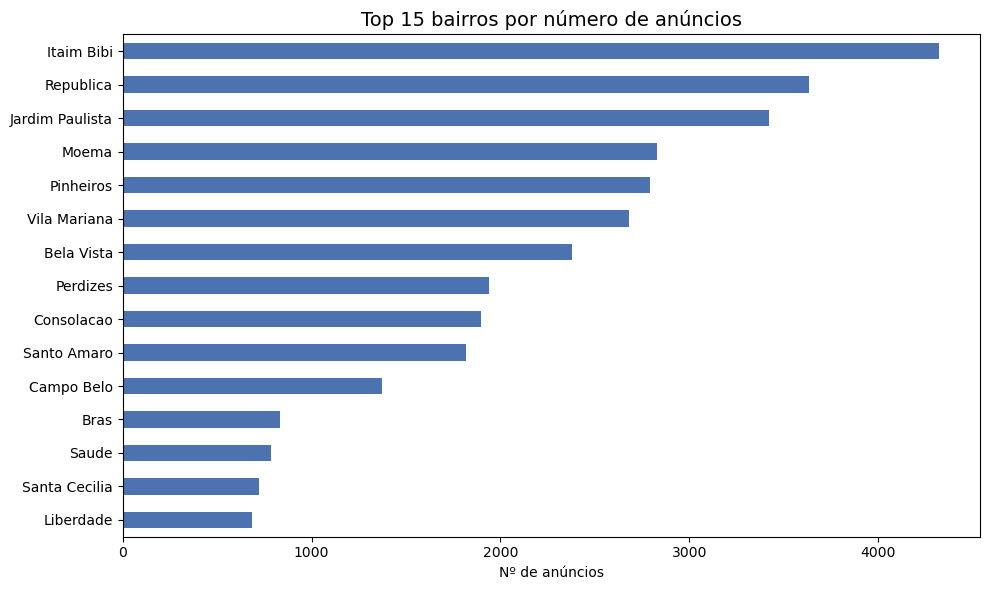

In [47]:
# 12.5 Gráfico - Top 15 bairros por nº de anúncios
fig, ax = plt.subplots(figsize=(10, 6))
top_bairros.sort_values().plot(kind='barh', ax=ax, color='#4C72B0')
ax.set_xlabel('Nº de anúncios')
ax.set_ylabel('')
ax.set_title('Top 15 bairros por número de anúncios', fontsize=14)
plt.tight_layout()
plt.show()

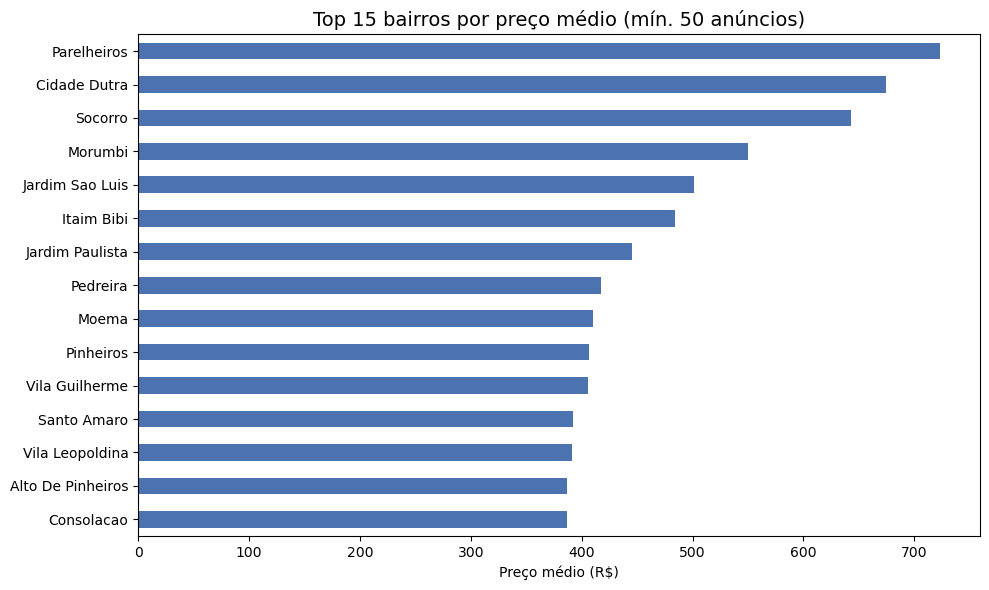

In [48]:
# 12.6 Gráfico - Top 15 bairros por preço médio
fig, ax = plt.subplots(figsize=(10, 6))
bairros_price['Preço médio (R$)'].sort_values().plot(kind='barh', ax=ax, color='#4C72B0')
ax.set_xlabel('Preço médio (R$)')
ax.set_ylabel('')
ax.set_title('Top 15 bairros por preço médio (mín. 50 anúncios)', fontsize=14)
plt.tight_layout()
plt.show()

In [49]:
# 12.7 Nota média por bairro (top 15, mín. 50 anúncios)
print("\n--- Top 15 bairros por nota geral (mín. 50 anúncios) ---")
bairros_nota = df.groupby('neighbourhood_cleansed').agg(
    nota=('review_scores_rating', 'mean'),
    n=('review_scores_rating', 'count')
).round(2)
bairros_nota = bairros_nota[bairros_nota['n'] >= 50].sort_values('nota', ascending=False).head(15)
bairros_nota.columns = ['Nota geral média', 'Nº de anúncios']
print(bairros_nota)


--- Top 15 bairros por nota geral (mín. 50 anúncios) ---
                        Nota geral média  Nº de anúncios
neighbourhood_cleansed                                  
Socorro                             4.95             105
Cidade Dutra                        4.91             145
Vila Formosa                        4.91              83
Vila Leopoldina                     4.90              57
Campo Grande                        4.87             161
Penha                               4.86              74
Vila Matilde                        4.86              71
Vila Sonia                          4.85             120
Tucuruvi                            4.85             216
Lapa                                4.84             214
Cursino                             4.83             118
Alto De Pinheiros                   4.83             215
Sacoma                              4.83              51
Santo Amaro                         4.83            1601
Butanta                       

#### Principais observações

Temos 96 bairros representados no dataset, sendo que 41 deles possuem mais de 100 anúncios. A concentração é forte nas regiões centrais e nobres: os 6 bairros com mais anúncios (Itaim Bibi, República, Jardim Paulista, Moema, Pinheiros e Vila Mariana) somam 19.680 anúncios, representando 47,7% do total.

- **Concentração por bairro**: Itaim Bibi lidera com 4.323 anúncios (10,5%), seguido por República (3.636, 8,8%) e Jardim Paulista (3.421, 8,3%). O gráfico de barras horizontais confirma a dominância desses bairros, que abrigam uma oferta muito superior às demais regiões.

- **Bairros mais caros**: Parelheiros lidera com preço médio de R$ 723, mas com apenas 50 anúncios — trata-se de uma zona rural com propriedades maiores. Cidade Dutra (R$ 675) e Socorro (R$ 643) seguem o mesmo padrão: bairros periféricos da zona sul com poucos anúncios e preços elevados, provavelmente refletindo chácaras e propriedades de maior área. Morumbi (R$ 550) é o primeiro bairro nobre da lista com volume significativo (423 anúncios).

- **Bairros nobres com volume**: entre os bairros com maior número de anúncios, Itaim Bibi (R$ 484), Jardim Paulista (R$ 445) e Moema (R$ 410) se destacam como as regiões de maior preço entre as de alta oferta. Esses bairros combinam localização privilegiada com grande disponibilidade de imóveis.

- **Bairros mais baratos**: Casa Verde (R$ 238), Tremembé (R$ 246) e Belém (R$ 255) são os mais acessíveis. Localizados em zonas mais periféricas (norte e leste), oferecem preços médios cerca de três vezes menores que os bairros nobres. A mediana de Tremembé (R$ 124) sugere alta proporção de quartos privados, que tipicamente apresentam preços inferiores a imóveis inteiros.

- **Notas por bairro**: as notas mais altas estão em bairros periféricos com poucos anúncios — Socorro (4,95), Cidade Dutra (4,91) e Vila Formosa (4,91). Não há correlação clara entre preço e nota: bairros nobres e periféricos apresentam notas médias semelhantes, todas acima de 4,8. A satisfação dos hóspedes não parece depender do bairro em si, mas sim da qualidade do imóvel e do anfitrião.

- **Dispersão geográfica**: o mercado de *short-term rental* em São Paulo está fortemente concentrado na zona centro-oeste (Itaim Bibi, Pinheiros, Vila Mariana, Jardim Paulista) e na região da República/Bela Vista, com preços mais altos nas zonas sul e oeste e mais baixos nas zonas norte e leste.

### 13. Análise de anfitriões

A variável `calculated_host_listings_count` indica o número total de anúncios de cada anfitrião. Esta análise investiga o grau de profissionalização no mercado paulistano, distinguindo anfitriões casuais (poucos imóveis) de operadores profissionais (múltiplos imóveis), e o impacto dessa diferenciação sobre preço e avaliações.

In [50]:
# 13. Análise de anfitriões

# 13.1 Estatísticas gerais
print("--- Estatísticas de imóveis por anfitrião ---")
print(df['calculated_host_listings_count'].describe().round(2))

--- Estatísticas de imóveis por anfitrião ---
count    41257.00
mean        42.77
std         82.40
min          1.00
25%          1.00
50%          7.00
75%         46.00
max        496.00
Name: calculated_host_listings_count, dtype: float64


In [51]:
# 13.2 Categorias de anfitrião
bins_host = [0, 1, 2, 5, 10, 20, 1000]
labels_host = ['1 imóvel', '2 imóveis', '3-5 imóveis', '6-10 imóveis', '11-20 imóveis', '20+ imóveis']
df['host_cat'] = pd.cut(df['calculated_host_listings_count'], bins=bins_host, labels=labels_host)

print("\n--- Distribuição por categoria de anfitrião ---")
host_count = df['host_cat'].value_counts().sort_index()
host_pct = (host_count / len(df) * 100).round(1)
host_table = pd.DataFrame({'Nº de anúncios': host_count, '% do total': host_pct})
host_table.index.name = 'Categoria de anfitrião'
print(host_table)


--- Distribuição por categoria de anfitrião ---
                        Nº de anúncios  % do total
Categoria de anfitrião                            
1 imóvel                         10979        26.6
2 imóveis                         4015         9.7
3-5 imóveis                       4736        11.5
6-10 imóveis                      3394         8.2
11-20 imóveis                     3632         8.8
20+ imóveis                      14501        35.1


In [52]:
# 13.3 Preço médio por categoria de anfitrião
print("\n--- Preço por categoria de anfitrião ---")
host_price = df.groupby('host_cat', observed=True)['price'].agg(['mean', 'median', 'count']).round(2)
host_price.columns = ['Preço médio (R$)', 'Mediana (R$)', 'Nº de anúncios']
host_price.index.name = 'Categoria de anfitrião'
print(host_price)


--- Preço por categoria de anfitrião ---
                        Preço médio (R$)  Mediana (R$)  Nº de anúncios
Categoria de anfitrião                                                
1 imóvel                          392.47        319.79           10979
2 imóveis                         363.73        309.00            4015
3-5 imóveis                       357.39        302.50            4736
6-10 imóveis                      369.64        320.00            3394
11-20 imóveis                     371.69        326.00            3632
20+ imóveis                       377.78        344.00           14501


In [53]:
# 13.4 Nota geral por categoria de anfitrião
print("\n--- Nota geral por categoria de anfitrião ---")
host_nota = df.groupby('host_cat', observed=True)['review_scores_rating'].agg(['mean', 'count']).round(2)
host_nota.columns = ['Nota geral média', 'Nº de anúncios']
host_nota.index.name = 'Categoria de anfitrião'
print(host_nota)


--- Nota geral por categoria de anfitrião ---
                        Nota geral média  Nº de anúncios
Categoria de anfitrião                                  
1 imóvel                            4.87            8915
2 imóveis                           4.87            3487
3-5 imóveis                         4.83            4195
6-10 imóveis                        4.78            2993
11-20 imóveis                       4.78            3248
20+ imóveis                         4.66           13107


In [54]:
# 13.5 Número de avaliações por categoria de anfitrião
print("\n--- Nº de avaliações por categoria de anfitrião ---")
host_reviews = df.groupby('host_cat', observed=True)['number_of_reviews'].agg(['mean', 'median', 'sum']).round(1)
host_reviews.columns = ['Média de avaliações', 'Mediana de avaliações', 'Total de avaliações']
host_reviews.index.name = 'Categoria de anfitrião'
print(host_reviews)


--- Nº de avaliações por categoria de anfitrião ---
                        Média de avaliações  Mediana de avaliações  Total de avaliações
Categoria de anfitrião                                                                 
1 imóvel                               36.3                   13.0               398954
2 imóveis                              44.5                   18.0               178697
3-5 imóveis                            45.6                   18.0               216135
6-10 imóveis                           41.9                   14.5               142279
11-20 imóveis                          35.7                   15.0               129639
20+ imóveis                            33.9                   13.0               492148


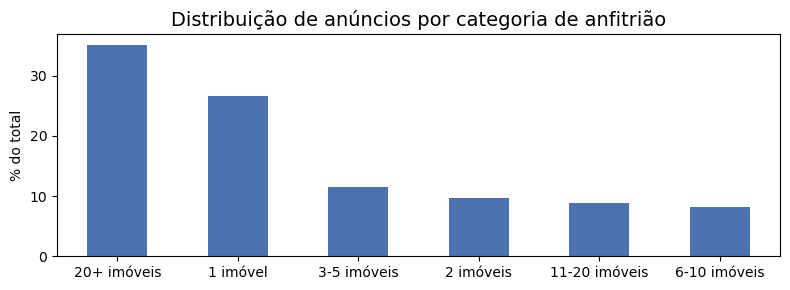

In [55]:
# 13.6 Gráfico - Distribuição por categoria de anfitrião
fig, ax = plt.subplots(figsize=(8, 3))
host_pct_sorted = host_pct.sort_values(ascending=False)
host_pct_sorted.plot(kind='bar', ax=ax, color='#4C72B0')
ax.set_xlabel('')
ax.set_ylabel('% do total')
ax.set_title('Distribuição de anúncios por categoria de anfitrião', fontsize=14)
ax.tick_params(axis='x', rotation=0)
plt.tight_layout()
plt.show()

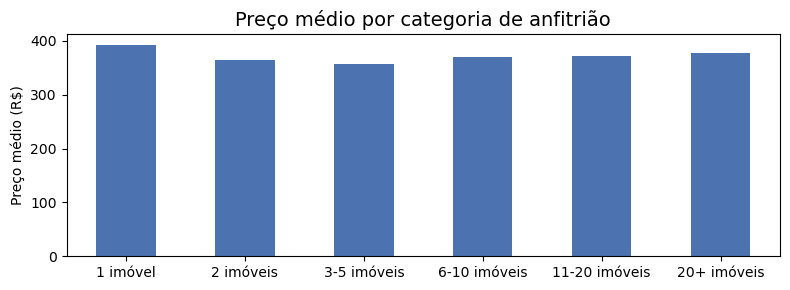

In [56]:
# 13.7 Gráfico - Preço médio por categoria de anfitrião
fig, ax = plt.subplots(figsize=(8, 3))
host_price['Preço médio (R$)'].plot(kind='bar', ax=ax, color='#4C72B0')
ax.set_xlabel('')
ax.set_ylabel('Preço médio (R$)')
ax.set_title('Preço médio por categoria de anfitrião', fontsize=14)
ax.tick_params(axis='x', rotation=0)
plt.tight_layout()
plt.show()

#### Principais observações

Temos um mercado polarizado entre dois extremos: 26,6% dos anúncios pertencem a anfitriões com apenas 1 imóvel (casuais) e 35,1% a anfitriões com 20+ imóveis (profissionais). Juntos, esses dois grupos representam 61,7% do mercado. A mediana de 7 imóveis por anfitrião confirma que o mercado é dominado por operadores com portfólio significativo, não por indivíduos com um único imóvel.

- **Preço vs. categorias**: Preço não diferencia categorias, os preços médios são muito próximos entre todas as categorias, variando de R$ 357 (3-5 imóveis) a R$ 392 (1 imóvel). Anfitriões com um único imóvel cobram ligeiramente mais, mas a diferença é pequena (~R$ 35). O gráfico de barras confirma distribuição praticamente plana. Não há prêmio de preço associado à escala operacional.

- **Notas decrescem com escala**: a relação entre número de imóveis e nota geral é inversamente proporcional. Anfitriões com 1 imóvel têm nota média de 4,87, enquanto os de 20+ imóveis têm 4,66 — uma diferença de 0,21 pontos. A queda é gradual e consistente: quanto mais imóveis, menor a nota. Isso sugere que a personalização do atendimento e a qualidade da hospedagem são mais difíceis de manter em escala.

- **Volume de avaliações por anúncio**: a média de avaliações por anúncio é maior nas categorias intermediárias (44,5 para 2 imóveis e 45,6 para 3-5 imóveis), enquanto anfitriões grandes (20+ imóveis) têm média de 33,9 avaliações por anúncio. Isso indica que imóveis de grandes operadores recebem menos avaliações individualmente, possivelmente por terem maior rotatividade de anúncios ou menor taxa de ocupação por propriedade.

- **Profissionalização do mercado**: com 35,1% dos anúncios concentrados em anfitriões com 20+ imóveis (média de 42,8 imóveis por anfitrião no dataset), fica claro que uma parcela significativa do mercado não é composta por indivíduos comuns alugando espaços ociosos, mas sim por empresas de gestão hoteleira e imobiliárias operando em escala. O valor máximo de 496 imóveis por anfitrião reforça esse perfil.

- **Trade-off escala vs. qualidade**: anfitriões profissionais ganham em volume e ocupação total, mas perdem em avaliação individual. Anfitriões casuais têm notas melhores, mas menor volume. O mercado não premia a escala com preço superior — a vantagem dos grandes operadores está na quantidade de anúncios e na capacidade de ocupação agregada, não na margem por imóvel.

### 14. Análise de identidade verificada

A variável `host_identity_verified` indica se o anfitrião teve sua identidade verificada pela plataforma. Esta análise investiga a proporção de anfitriões verificados e se a verificação está associada a diferenças em preço, avaliações e número de imóveis.

In [57]:
# 14. Análise de identidade verificada

# Adicionar labels booleanos se não existirem
labels[True] = labels.get(True, 'Verificado')
labels[False] = labels.get(False, 'Não verificado')

# 14.1 Estatísticas gerais
print("--- Distribuição de identidade verificada ---")
id_count = df['host_identity_verified'].value_counts()
id_pct = (id_count / len(df) * 100).round(1)
id_table = pd.DataFrame({'Nº de anúncios': id_count, '% do total': id_pct})
id_table.index = [labels.get(v, v) for v in id_table.index]
print(id_table)

--- Distribuição de identidade verificada ---
                Nº de anúncios  % do total
Verificado               40090        97.2
Não verificado            1167         2.8


In [58]:
# 14.2 Preço médio por verificação
print("\n--- Preço por verificação de identidade ---")
id_price = df.groupby('host_identity_verified')['price'].agg(['mean', 'median', 'count']).round(2)
id_price.columns = ['Preço médio (R$)', 'Mediana (R$)', 'Nº de anúncios']
id_price.index = [labels.get(v, v) for v in id_price.index]
print(id_price)


--- Preço por verificação de identidade ---
                Preço médio (R$)  Mediana (R$)  Nº de anúncios
Não verificado            468.99         408.0            1167
Verificado                374.09         328.5           40090


In [59]:
# 14.3 Nota geral por verificação
print("\n--- Nota geral por verificação de identidade ---")
id_nota = df.groupby('host_identity_verified')['review_scores_rating'].agg(['mean', 'count']).round(2)
id_nota.columns = ['Nota geral média', 'Nº de anúncios']
id_nota.index = [labels.get(v, v) for v in id_nota.index]
print(id_nota)


--- Nota geral por verificação de identidade ---
                Nota geral média  Nº de anúncios
Não verificado              4.35             932
Verificado                  4.79           35013


In [60]:
# 14.4 Nº de imóveis por verificação
print("\n--- Nº de imóveis por anfitrião por verificação ---")
id_imoveis = df.groupby('host_identity_verified')['calculated_host_listings_count'].agg(['mean', 'median']).round(1)
id_imoveis.columns = ['Média de imóveis', 'Mediana de imóveis']
id_imoveis.index = [labels.get(v, v) for v in id_imoveis.index]
print(id_imoveis)


--- Nº de imóveis por anfitrião por verificação ---
                Média de imóveis  Mediana de imóveis
Não verificado             270.1               192.0
Verificado                  36.2                 6.0


In [61]:
# 14.5 Verificação cruzada com superhost
print("\n--- Verificação x Superhost ---")
cross = pd.crosstab(df['host_identity_verified'], df['host_is_superhost'])
cross.index = [labels.get(v, v) for v in cross.index]
cross.columns = [labels.get(c, c) for c in cross.columns]
print(cross)


--- Verificação x Superhost ---
                Não verificado  Verificado
Não verificado            1012         155
Verificado               19880       20210


#### Principais observações

A verificação de identidade é quase universal no mercado paulistano: 97,2% dos anúncios pertencem a anfitriões verificados (40.090) e apenas 2,8% a não verificados (1.167).

- **Paradoxo do preço**: anfitriões não verificados cobram em média R$ 469, contra R$ 374 dos verificados — uma diferença de R$ 95 (25% mais caro). O gráfico de barras confirma essa diferença. Isso é contraintuitivo, pois esperaria-se que anfitriões verificados pudessem cobrar um prêmio de confiança.

- **Notas significativamente menores**: anfitriões não verificados têm nota média de 4,35, contra 4,79 dos verificados. Essa diferença de 0,44 pontos é a maior observada entre quaisquer categorias analisadas neste estudo. A qualidade percebida da hospedagem é substancialmente inferior entre anfitriões não verificados.

- **Perfil dos não verificados**: a média de imóveis por anfitrião não verificado é 270,1 (mediana de 192), contra 36,2 (mediana de 6) entre verificados. Os anfitriões não verificados são, em sua maioria, grandes operadores profissionais com portfólios massivos. O preço elevado e a nota baixa desses anfitriões refletem o mesmo padrão observado na seção anterior: escala operacional está associada a pior avaliação individual.

- **Verificação e superhost**: entre anfitriões verificados, 50,4% são superhosts (20.210 de 40.090). Entre não verificados, apenas 13,3% são superhosts (155 de 1.167). A verificação de identidade está fortemente associada ao status de superhost, o que é esperado — a plataforma provavelmente exige verificação como pré-requisito para o programa.

- **Interpretação do conjunto**: os dados sugerem que os 2,8% de anfitriões não verificados não são indivíduos casuais que ainda não verificaram sua identidade, mas sim operadores comerciais de grande escala que operam fora dos padrões de verificação da plataforma. Seus preços mais altos e notas mais baixas reforçam esse perfil. A verificação de identidade, mais do que um selo de confiança, funciona como um filtro que separa anfitriões individuais de operações comerciais em larga escala.

### 15. Análise de estadia mínima

A variável `minimum_nights` indica o número mínimo de noites exigido por reserva. Esta análise investiga como as exigências de estadia mínima se distribuem no mercado paulistano e se estão associadas a diferenças em preço e tipo de acomodação.

In [62]:
# 15. Análise de estadia mínima

# 15.1 Estatísticas gerais
print("--- Estatísticas de estadia mínima ---")
print(df['minimum_nights'].describe().round(2))

--- Estatísticas de estadia mínima ---
count    41257.00
mean         2.28
std          4.26
min          1.00
25%          1.00
50%          1.00
75%          2.00
max         90.00
Name: minimum_nights, dtype: float64


In [63]:
# 15.2 Categorias de estadia mínima
bins_nights = [0, 1, 2, 3, 7, 14, 30, 1000]
labels_nights = ['1 noite', '2 noites', '3 noites', '4-7 noites', '8-14 noites', '15-30 noites', '30+ noites']
df['min_nights_cat'] = pd.cut(df['minimum_nights'], bins=bins_nights, labels=labels_nights)

print("\n--- Distribuição por categoria de estadia mínima ---")
nights_count = df['min_nights_cat'].value_counts().sort_index()
nights_pct = (nights_count / len(df) * 100).round(1)
nights_table = pd.DataFrame({'Nº de anúncios': nights_count, '% do total': nights_pct})
nights_table.index.name = 'Categoria de estadia mínima'
print(nights_table)


--- Distribuição por categoria de estadia mínima ---
                             Nº de anúncios  % do total
Categoria de estadia mínima                            
1 noite                               25182        61.0
2 noites                              10946        26.5
3 noites                               2110         5.1
4-7 noites                             1614         3.9
8-14 noites                             291         0.7
15-30 noites                           1081         2.6
30+ noites                               33         0.1


In [64]:
# 15.3 Preço médio por categoria de estadia mínima
print("\n--- Preço por categoria de estadia mínima ---")
nights_price = df.groupby('min_nights_cat', observed=True)['price'].agg(['mean', 'median', 'count']).round(2)
nights_price.columns = ['Preço médio (R$)', 'Mediana (R$)', 'Nº de anúncios']
nights_price.index.name = 'Categoria de estadia mínima'
print(nights_price)


--- Preço por categoria de estadia mínima ---
                             Preço médio (R$)  Mediana (R$)  Nº de anúncios
Categoria de estadia mínima                                                
1 noite                                389.62        347.00           25182
2 noites                               363.32        305.14           10946
3 noites                               380.54        304.33            2110
4-7 noites                             358.19        270.50            1614
8-14 noites                            310.39        235.54             291
15-30 noites                           260.33        173.70            1081
30+ noites                             102.67         73.01              33


In [65]:
# 15.4 Estadia mínima por tipo de quarto
print("\n--- Estadia mínima média por tipo de quarto ---")
nights_room = df.groupby('room_type', observed=True)['minimum_nights'].agg(['mean', 'median']).round(1)
nights_room.index = [labels.get(r, r) for r in nights_room.index]
nights_room.columns = ['Média de noites', 'Mediana de noites']
print(nights_room)


--- Estadia mínima média por tipo de quarto ---
                 Média de noites  Mediana de noites
Entire home/apt              2.2                1.0
Hotel room                   2.3                1.0
Private room                 2.6                1.0
Shared room                  1.5                1.0


In [66]:
# 15.5 Estadia mínima por categoria de anfitrião
print("\n--- Estadia mínima por categoria de anfitrião ---")
nights_host = df.groupby('host_cat', observed=True)['minimum_nights'].agg(['mean', 'median']).round(1)
nights_host.columns = ['Média de noites', 'Mediana de noites']
nights_host.index.name = 'Categoria de anfitrião'
print(nights_host)


--- Estadia mínima por categoria de anfitrião ---
                        Média de noites  Mediana de noites
Categoria de anfitrião                                    
1 imóvel                            2.9                2.0
2 imóveis                           2.5                1.0
3-5 imóveis                         2.3                1.0
6-10 imóveis                        2.3                1.0
11-20 imóveis                       2.0                1.0
20+ imóveis                         1.8                1.0


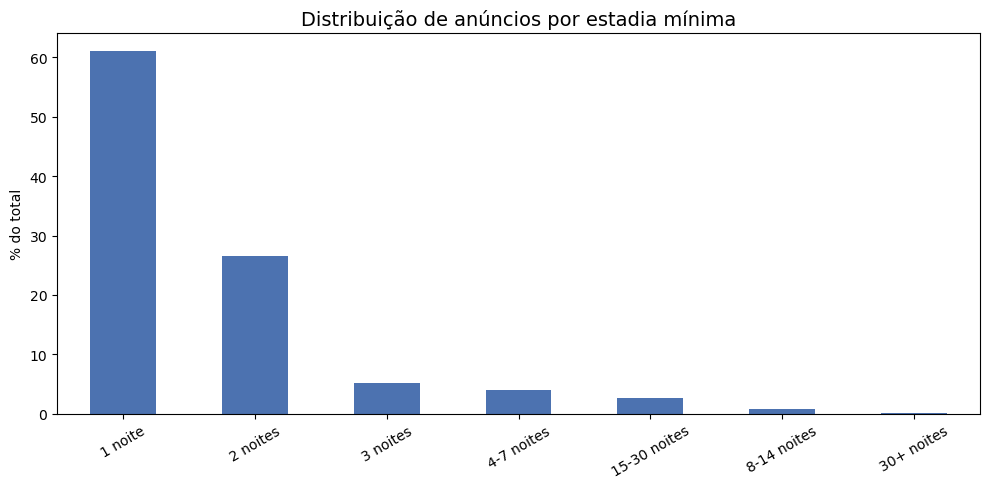

In [67]:
# 15.6 Gráfico - Distribuição por categoria de estadia mínima
fig, ax = plt.subplots(figsize=(10, 5))
nights_pct.sort_values(ascending=False).plot(kind='bar', ax=ax, color='#4C72B0')
ax.set_xlabel('')
ax.set_ylabel('% do total')
ax.set_title('Distribuição de anúncios por estadia mínima', fontsize=14)
ax.tick_params(axis='x', rotation=30)
plt.tight_layout()
plt.show()

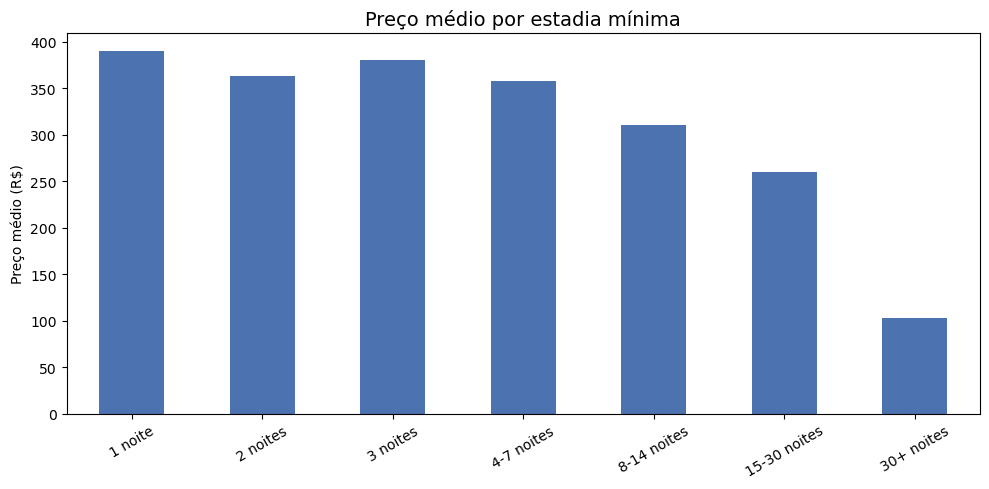

In [68]:
# 15.7 Gráfico - Preço médio por estadia mínima
fig, ax = plt.subplots(figsize=(10, 5))
nights_price['Preço médio (R$)'].plot(kind='bar', ax=ax, color='#4C72B0')
ax.set_xlabel('')
ax.set_ylabel('Preço médio (R$)')
ax.set_title('Preço médio por estadia mínima', fontsize=14)
ax.tick_params(axis='x', rotation=30)
plt.tight_layout()
plt.show()

#### Principais observações

O mercado paulistano é predominantemente de curtas estadias: 61% dos anúncios exigem apenas 1 noite mínima e 26,5% exigem 2 noites. Juntas, essas duas categorias representam 87,5% do mercado. A mediana é de 1 noite e a média de 2,3, com máximo de 90 noites. O gráfico de barras confirma a dominância absoluta da categoria de 1 noite, com queda acentuada a partir de 3 noites.

- **Relação inversa com preço**: há uma correlação clara entre estadia mínima e preço — quanto maior a exigência de noites, menor o preço por diária. Anúncios com 1 noite mínima custam em média R$ 390, enquanto os de 15-30 noites custam R$ 260 e os de 30+ noites apenas R$ 103. O gráfico de barras mostra queda progressiva e consistente. Isso reflete a lógica de que estadias longas funcionam como aluguel mensal, com desconto proporcional à duração.

- **Estadia mínima por tipo de acomodação**: a mediana é de 1 noite para todos os tipos, mas a média varia. Quartos privados exigem mais noites em média (2,6), possivelmente refletindo anfitriões que preferem hóspedes de permanência mais longa em espaços compartilhados. Quartos compartilhados têm a menor média (1,5), indicando uso mais voltado para passagens curtas.

- **Estadia mínima por categoria de anfitrião**: há relação inversa entre escala e exigência de noites. Anfitriões com 1 imóvel exigem em média 2,9 noites (mediana 2), enquanto os de 20+ imóveis exigem apenas 1,8 (mediana 1). Anfitriões profissionais reduzem a barreira de entrada (1 noite) para maximizar taxa de ocupação e rotatividade, enquanto anfitriões casuais tendem a exigir estadias um pouco mais longas, possivelmente para reduzir o esforço de turnover entre hóspedes.

- **Nicho de estadias longas**: apenas 1.114 anúncios (2,7%) exigem 15+ noites, com preços muito inferiores (R$ 103-260). Esse nicho provavelmente representa imóveis posicionados como aluguel residencial mensal disfarçado de short-term rental, com diárias equivalentes a R$ 3-9 — compatíveis com mercado tradicional de aluguel, não com hospedagem turística.

### 16. Conclusões e insights

#### Visão geral do mercado

O dataset de Airbnb em São Paulo contém 41.257 anúncios distribuídos em 96 bairros, com preço médio de `R$ 376` e mediana de `R$ 320`. O mercado é dominado por imóveis inteiros (76,7% dos anúncios), refletindo uma oferta voltada principalmente para hospedagem autônoma em vez de quartos compartilhados. A capacidade mediana é de três hóspedes, e a estadia mínima predominante é de uma noite (61%), configurando um mercado de curtas estadias.

#### Profissionalização e escala

Um dos achados mais expressivos é o grau de profissionalização: 35,1% dos anúncios pertencem a anfitriões com mais de 20 imóveis, e a mediana de imóveis por anúncio é sete, ou seja, metade dos anúncios pertence a anfitriões que gerenciam sete ou mais imóveis. O mercado não é composto majoritariamente por indivíduos alugando espaços ociosos, mas sim por operadores comerciais em escala. Apenas 26,6% dos anúncios pertencem a anfitriões com um único imóvel.

Esse perfil se reflete em múltiplas dimensões:

- **Escala vs. qualidade**: notas decrescem consistentemente com o número de imóveis, de 4,87 (um imóvel) para 4,66 (20+ imóveis). A personalização do atendimento é mais difícil em escala.

- **Escala vs. estadia mínima**: anfitriões profissionais reduzem a barreira de entrada (1 noite) para maximizar ocupação, enquanto casuais exigem mais noites (mediana 2).

- **Preço não premia escala**: não há prêmio de preço associado a maior portfólio. Os preços médios são praticamente planos entre categorias de anfitrião (~`R$ 357`-`R$ 392`).

#### Geografia e estratificação

O mercado está fortemente concentrado na zona centro-oeste (Itaim Bibi, Pinheiros, Vila Mariana, Jardim Paulista) e República/Bela Vista — os seis bairros com mais anúncios somam 47,7% do total. A estratificação de preços segue o esperado: bairros nobres como Itaim Bibi (`R$ 484`) e Jardim Paulista (`R$ 445`) estão entre os mais caros, enquanto bairros periféricos como Casa Verde (`R$ 238`) e Tremembé (`R$ 246`) são os mais acessíveis.

Curiosamente, bairros periféricos da zona sul (Parelheiros `R$ 723`, Cidade Dutra `R$ 675`, Socorro `R$ 643`) lideram o ranking de preço médio, provavelmente refletindo chácaras e propriedades de maior área, não necessariamente imóveis de luxo.

As notas por bairro não mostram correlação com preço — bairros caros e baratos apresentam notas acima de 4,8. A satisfação do hóspede depende mais do imóvel e do anfitrião do que da localização.

#### Superhost: selo de qualidade com prêmio limitado

Apenas 16,1% dos anúncios são de superhosts. Superhosts cobram em média `R$ 366` vs. `R$ 382` de anfitriões comuns — ou seja, não há prêmio de preço; se houver vantagem, é na taxa de ocupação. As notas de superhosts são consistentemente superiores em todas as dimensões avaliadas (geral, limpeza, localização, comunicação), com diferenças de 0,15-0,20 pontos. Superhosts também têm mais avaliações por anúncio (média 55,2 vs. 27,3), indicando maior rotatividade e confiança dos hóspedes.

#### Verificação de identidade

A verificação é quase universal (97,2%). Os 2,8% não verificados não são anfitriões casuais — são grandes operadores (média de 270 imóveis) com preços mais altos (`R$ 469`) e notas significativamente menores (4,35 vs. 4,79). A verificação funciona mais como filtro operacional que separa anfitriões individuais de operações comerciais em larga escala.

#### Disponibilidade e atividade

A disponibilidade mediana é de 55 dias por ano, com 24,6% dos anúncios com menos de 30 dias disponíveis e 34,9% com mais de 300 dias. Há uma segmentação clara entre anúncios ativos (alta disponibilidade) e inativos/ocasionais (baixa disponibilidade). O número de avaliações varia amplamente (mediana 15, média 33,4), refletindo diferentes níveis de maturidade dos anúncios.

#### Limitações da análise

- `last_review` captura apenas a data mais recente, não o histórico completo — não permite análise de sazonalidade real.
- `price` é o preço da diária no momento da extração e pode não refletir preços efetivamente praticados (descontos para estadias longas não estão capturados).
- Variáveis como área do imóvel, amenities e taxa de ocupação real não estão disponíveis, limitando inferências sobre qualidade vs. preço.
- Anúncios sem avaliação (12,9%) foram excluídos das análises de nota, o que pode introduzir viés de seleção.

### 17. Modelagem preditiva de preço

A EDA revelou que localização, tipo de acomodação e escala do anfitrião influenciam o preço — mas de forma qualitativa. Aqui construímos um modelo que **quantifica** essas relações e testa sua capacidade preditiva: uma Regressão Linear como baseline, comparada a um Random Forest, que captura relações não-lineares e interações entre variáveis.

O preço é transformado em log (`log1p`) antes do treino, já que sua distribuição é assimetricamente à direita — prática padrão para esse tipo de variável.

In [ ]:
features_num = ['accommodates', 'bedrooms', 'bathrooms', 'minimum_nights',
                 'maximum_nights', 'calculated_host_listings_count',
                 'availability_365', 'number_of_reviews']
features_cat = ['room_type', 'neighbourhood_cleansed', 'host_is_superhost',
                 'host_identity_verified']

df_model = df.dropna(subset=features_num + features_cat + ['price']).copy()

# Reduz cardinalidade de bairro: mantém os 20 mais frequentes, agrupa o resto em "Outros"
top_bairros = df_model['neighbourhood_cleansed'].value_counts().head(20).index
df_model['neighbourhood_cleansed'] = df_model['neighbourhood_cleansed'].where(
    df_model['neighbourhood_cleansed'].isin(top_bairros), 'Outros'
)

X = df_model[features_num + features_cat]
y = np.log1p(df_model['price'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"Treino: {X_train.shape[0]} anúncios | Teste: {X_test.shape[0]} anúncios")

Treino: 33005 anúncios | Teste: 8252 anúncios


#### Treino e comparação de modelos

In [70]:
preprocessor = ColumnTransformer(transformers=[
    ('num', 'passthrough', features_num),
    ('cat', OneHotEncoder(handle_unknown='ignore', drop='first'), features_cat)
])

modelos = {
    'Regressão Linear': LinearRegression(),
    'Random Forest': RandomForestRegressor(n_estimators=300, max_depth=15, random_state=42, n_jobs=-1)
}

resultados = []
for nome, modelo in modelos.items():
    pipe = Pipeline([('prep', preprocessor), ('reg', modelo)])
    pipe.fit(X_train, y_train)
    y_pred_log = pipe.predict(X_test)

    y_pred = np.expm1(y_pred_log)  # volta para R$ (escala original)
    y_true = np.expm1(y_test)

    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_test, y_pred_log)

    resultados.append({'Modelo': nome, 'MAE (R$)': round(mae, 2),
                        'RMSE (R$)': round(rmse, 2), 'R²': round(r2, 3)})

    if nome == 'Random Forest':
        rf_pipe = pipe  # guarda para a análise de importância

pd.DataFrame(resultados)

,Modelo,MAE (R$),RMSE (R$),R²
0,Regressão Linear,113.50,219.86,0.419
1,Random Forest,100.13,200.61,0.539


#### Importância das variáveis

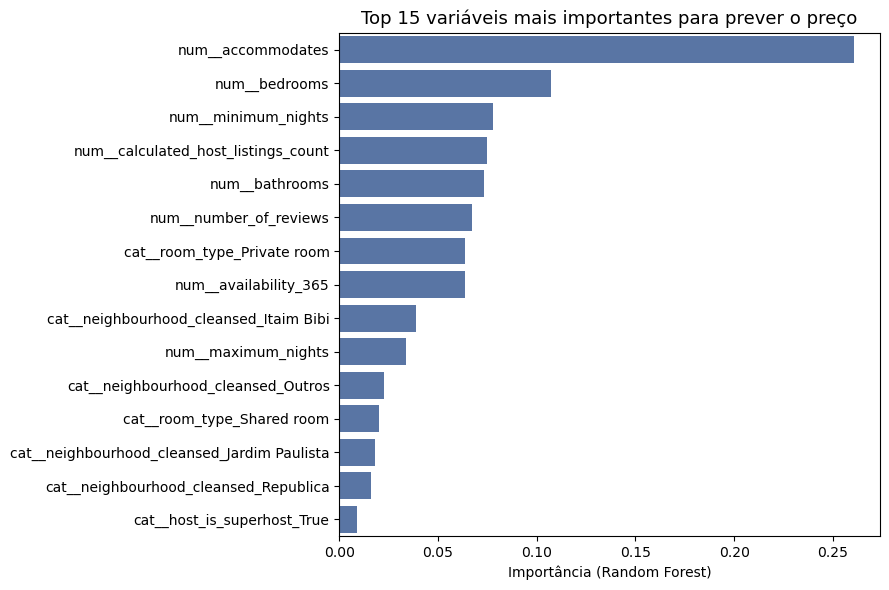

In [71]:
importancias = rf_pipe.named_steps['reg'].feature_importances_
nomes_features = rf_pipe.named_steps['prep'].get_feature_names_out()

fi_df = pd.DataFrame({'feature': nomes_features, 'importancia': importancias})
fi_df = fi_df.sort_values('importancia', ascending=False).head(15)

plt.figure(figsize=(9, 6))
sns.barplot(data=fi_df, x='importancia', y='feature', color='#4C72B0')
plt.title('Top 15 variáveis mais importantes para prever o preço', fontsize=13)
plt.xlabel('Importância (Random Forest)')
plt.ylabel('')
plt.tight_layout()
plt.show()

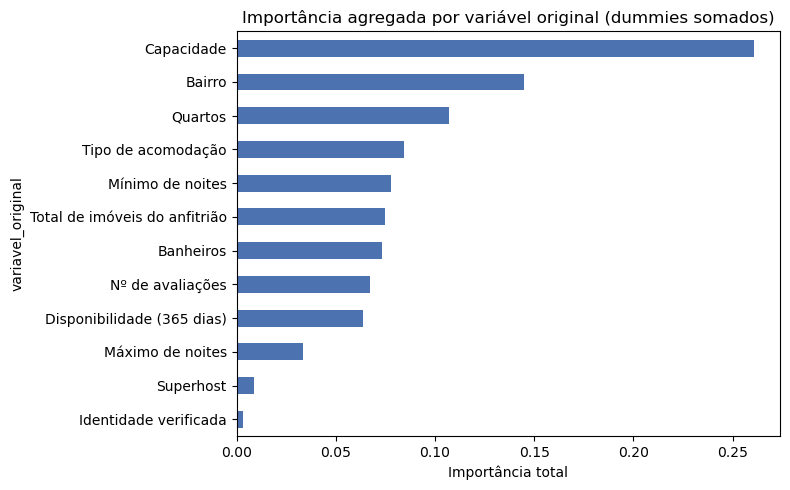

In [72]:
fi_completo = pd.DataFrame({'feature': nomes_features, 'importancia': importancias})

def agrupar_original(nome):
    if nome.startswith('cat__neighbourhood_cleansed'):
        return 'Bairro'
    if nome.startswith('cat__room_type'):
        return 'Tipo de acomodação'
    if nome.startswith('cat__host_is_superhost'):
        return 'Superhost'
    if nome.startswith('cat__host_identity_verified'):
        return 'Identidade verificada'
    return labels.get(nome.replace('num__', ''), nome.replace('num__', ''))

fi_completo['variavel_original'] = fi_completo['feature'].apply(agrupar_original)
importancia_agrupada = (
    fi_completo.groupby('variavel_original')['importancia']
    .sum()
    .sort_values(ascending=False)
)

plt.figure(figsize=(8, 5))
importancia_agrupada.plot(kind='barh', color='#4C72B0')
plt.gca().invert_yaxis()
plt.title('Importância agregada por variável original (dummies somados)')
plt.xlabel('Importância total')
plt.tight_layout()
plt.show()

#### Principais observações

O Random Forest superou a Regressão Linear em todas as métricas (RMSE de R$ 219,86 para R$ 200,61; R² de 0,419 para 0,539), confirmando a existência de relações não-lineares entre as variáveis que o modelo linear não capta — provavelmente interações entre bairro, tipo de acomodação e capacidade. O erro médio absoluto de R$ 100,13 sobre um preço médio de R$ 376 representa ~27% de erro relativo: um resultado honesto, mas limitado pela ausência de variáveis que tipicamente pesam no preço de um Airbnb, como amenidades, qualidade das fotos e localização exata dentro do bairro.

**Sobre a importância das variáveis:** o gráfico bruto de importância do Random Forest sugeria, à primeira vista, que bairro tinha pouca influência sobre o preço — o que contradizia diretamente os achados da seção 12 da EDA. A explicação não é uma contradição real, mas um artefato da codificação: como `neighbourhood_cleansed` foi transformado em ~19 colunas dummy, sua importância ficou fatiada entre múltiplas colunas pequenas, enquanto `accommodates` concentrou toda sua força em uma única coluna numérica.

Ao agregar a importância de volta por variável original, o quadro se reconcilia com a EDA: **Capacidade** continua sendo o fator mais determinante (0,26), mas **Bairro** sobe para o 2º lugar (0,145) — à frente de Quartos, Tipo de acomodação e Estadia mínima. Isso confirma o que a EDA já indicava qualitativamente (localização estratifica fortemente o preço, seção 12), mas quantifica que capacidade do imóvel ainda pesa mais que localização na formação do preço em São Paulo — um achado que só ficou visível ao questionar a leitura ingênua do primeiro gráfico.

### 18. Mapa coroplético — preço médio por bairro

Além da distribuição por ponto (seção 7.2), mapeamos o preço médio agregado por bairro usando os polígonos oficiais de bairro do próprio Inside Airbnb, o que permite visualizar padrões espaciais de forma mais clara que um scatter de pontos sobrepostos.

In [ ]:
geojson_url = r"https://data.insideairbnb.com/brazil/sp/s%C3%A3o-paulo/2026-06-14/visualisations/neighbourhoods.geojson"
bairros_geo = gpd.read_file(geojson_url)

# Preço médio por bairro (usando o df tratado, antes do agrupamento em "Outros" do modelo)
preco_bairro = df.groupby('neighbourhood_cleansed')['price'].agg(['median', 'count']).reset_index()
preco_bairro.columns = ['neighbourhood', 'preco_medio', 'n_anuncios']
preco_bairro.loc[preco_bairro['n_anuncios'] < 30, 'preco_medio'] = np.nan  # bairros com poucos anúncios ficam cinza

# Checagem de correspondência entre nomes do df e do geojson — nunca assuma que bate 100%
nao_encontrados = set(preco_bairro['neighbourhood']) - set(bairros_geo['neighbourhood'])
print(f"Bairros sem correspondência no geojson: {len(nao_encontrados)}")
if nao_encontrados:
    print(nao_encontrados)

mapa_dados = bairros_geo.merge(preco_bairro, on='neighbourhood', how='left')

m = folium.Map(location=[-23.58, -46.63], zoom_start=11, tiles='cartodbpositron')

folium.Choropleth(
    geo_data=mapa_dados,
    data=mapa_dados,
    columns=['neighbourhood', 'preco_medio'],
    key_on='feature.properties.neighbourhood',
    fill_color='YlOrRd',
    fill_opacity=0.75,
    line_opacity=0.3,
    legend_name='Preço médio (R$)',
    nan_fill_color='lightgrey'
).add_to(m)

folium.GeoJson(
    mapa_dados,
    style_function=lambda x: {'fillOpacity': 0, 'weight': 0},
    tooltip=folium.GeoJsonTooltip(
        fields=['neighbourhood', 'preco_medio', 'n_anuncios'],
        aliases=['Bairro:', 'Preço médio (R$):', 'Nº de anúncios:'],
        localize=True
    )
).add_to(m)

m

Bairros sem correspondência no geojson: 0


In [74]:
# Identificando o bairro do ponto vermelho isolado (zona leste, alto preço, amostra robusta)
top_leste = preco_bairro[preco_bairro['n_anuncios'] >= 30].sort_values('preco_medio', ascending=False).head(10)
print(top_leste)

      neighbourhood  preco_medio  n_anuncios
29           Grajau      744.675          40
55      Parelheiros      685.000          50
22     Cidade Dutra      513.670         177
80          Socorro      502.500         136
54          Morumbi      485.000         423
33       Itaim Bibi      423.000        4323
43  Jardim Paulista      391.000        3421
52            Moema      371.000        2829
62        Pinheiros      362.750        2792
81          Tatuape      344.500         464


In [75]:
# Investigando o perfil dos imóveis em Artur Alvim
print(df[df['neighbourhood_cleansed'] == 'Artur Alvim'][
    ['room_type', 'accommodates', 'bedrooms', 'price']
].describe())

print("\n--- Tipo de acomodação em Artur Alvim ---")
print(df[df['neighbourhood_cleansed'] == 'Artur Alvim']['room_type'].value_counts())

       accommodates   bedrooms        price
count     38.000000  38.000000    38.000000
mean       4.578947   1.605263   599.391053
std        3.184690   0.594546   599.853487
min        1.000000   1.000000   156.000000
25%        2.250000   1.000000   204.100000
50%        4.000000   2.000000   245.430000
75%        5.000000   2.000000  1010.190000
max       16.000000   3.000000  2358.000000

--- Tipo de acomodação em Artur Alvim ---
room_type
Entire home/apt    34
Private room        4
Name: count, dtype: int64


#### Principais observações

O mapa coroplético usa a **mediana** de preço por bairro, em vez da média, por ser mais robusta a outliers em bairros com amostra pequena — uma escolha validada durante a análise: ao testar inicialmente com a média, um bairro isolado na zona leste (Artur Alvim, R\$ 599 de média) aparecia como polo de preço elevado, mas sua mediana real era de apenas R\$ 245. O valor alto vinha de poucos imóveis de grande capacidade (até 16 hóspedes) distorcendo a média em uma amostra de apenas 38 anúncios. Com a mediana, esse falso padrão desaparece.

O mapa confirma visualmente o padrão identificado na análise por bairro (seção 12): a faixa sul do município (Parelheiros, Grajaú, Cidade Dutra, Socorro) concentra os maiores preços medianos, provavelmente refletindo propriedades de maior área (chácaras) em vez de imóveis urbanos de alto padrão — e, diferente do caso de Artur Alvim, esse padrão se mantém mesmo com a métrica mais robusta, reforçando que é um efeito geográfico real, não um artefato estatístico.

Esse exercício reforça um princípio geral de análise espacial: métricas de agregação sensíveis a outliers (como a média) podem gerar padrões geográficos enganosos em regiões de baixa densidade amostral — um cuidado especialmente relevante ao trabalhar com dados espaciais heterogêneos, como bairros com número muito desigual de anúncios.

### 19. Modelagem preditiva de preços

Nesta etapa, nosso objetivo é construir um modelo de *Machine Learning* capaz de prever o valor da diária (`price`) com base nas características do imóvel, do anfitrião e da localização. 

#### Engenharia de atributos

A variável `amenities` contém listas detalhadas de facilidades oferecidas em cada anúncio. Para que um algoritmo possa processar essas informações, precisamos transformar esses textos em dados estruturados.

Vamos extrair comodidades de alto valor agregado no mercado de hospitalidade e criar colunas binárias para o nosso modelo: **1** se o imóvel possui a comodidade e **0** caso contrário. As comodidades escolhidas para extração são: piscina, ar-condicionado, academia e permissão para animais de estimação.

In [76]:
# Extração de Amenidades

# Criando colunas binárias para amenidades específicas (1 se tem, 0 se não tem)
df['tem_piscina'] = df['amenities'].str.contains('Pool|piscina', case=False, na=False).astype(int)
df['tem_ar_condicionado'] = df['amenities'].str.contains('Air conditioning|Ar condicionado', case=False, na=False).astype(int)
df['tem_academia'] = df['amenities'].str.contains('Gym|academia', case=False, na=False).astype(int)
df['aceita_pets'] = df['amenities'].str.contains('Pets allowed|Permitido animais', case=False, na=False).astype(int)

# Opcional: Você pode visualizar como ficaram as novas colunas
display(df[['amenities', 'tem_piscina', 'tem_ar_condicionado', 'tem_academia', 'aceita_pets']].head())

# Como já extraímos o que precisávamos, podemos descartar a coluna original de texto
df = df.drop(columns=['amenities'])

,amenities,tem_piscina,tem_ar_condicionado,tem_academia,aceita_pets
0,"[""Free washer \u2013 In unit"", ""Ethernet conne...",1,0,1,0
1,"[""Free washer \u2013 In unit"", ""Fire extinguis...",1,0,1,1
2,"[""Free street parking"", ""Coffee maker: Nespres...",0,0,0,0
3,"[""Free washer \u2013 In unit"", ""Ethernet conne...",0,0,0,0
4,"[""Ethernet connection"", ""Fireplace guards"", ""C...",0,0,0,0


#### Preparação e pré-processamento

Antes de alimentar o modelo preditivo, precisamos finalizar a preparação da nossa base de dados. Este processo envolve três etapas fundamentais:

1. **Tratamento final de valores ausentes:** Vamos preencher as notas de avaliação nulas (`review_scores_rating`) com a mediana. Como descobrimos anteriormente que esses nulos representam anúncios sem avaliação, essa abordagem nos permite manter essas propriedades na análise sem distorcer o modelo.
2. **Seleção de variáveis:** Vamos isolar as variáveis preditoras (`X`) da nossa variável alvo (`y`), que é o preço da diária.
3. **Encoding de variáveis categóricas:** Algoritmos matemáticos exigem entradas numéricas. Utilizaremos a técnica de *One-Hot Encoding* para transformar variáveis de texto (como o bairro e o tipo de acomodação) em múltiplas colunas binárias.

In [77]:
# Preparação dos Dados

# Tratando variáveis booleanas e nulos restantes
df['host_is_superhost'] = df['host_is_superhost'].fillna(False).astype(int)
# Imputando a nota de avaliação com a mediana para não perder os dados sem review
df['review_scores_rating'] = df['review_scores_rating'].fillna(df['review_scores_rating'].median())

# Selecionando as variáveis que vão alimentar o modelo
features = [
    'host_is_superhost', 'neighbourhood_cleansed', 'room_type', 
    'accommodates', 'bedrooms', 'bathrooms', 'minimum_nights', 
    'availability_365', 'number_of_reviews', 'review_scores_rating', 
    'tem_piscina', 'tem_ar_condicionado', 'tem_academia', 'aceita_pets'
]

# Separando X (variáveis preditoras) e y (variável alvo/target)
X = df[features].copy()
y = df['price']

# Transformando variáveis categóricas (Bairro e Tipo de Quarto) em colunas binárias (One-Hot Encoding)
X = pd.get_dummies(X, columns=['neighbourhood_cleansed', 'room_type'], drop_first=True)

# Visualizando o formato final dos dados para o modelo
print(f"Features: {X.shape[1]} colunas criadas após o encoding.")

Features: 110 colunas criadas após o encoding.


#### Treinamento do modelo (Random Forest)

Com os dados devidamente estruturados, podemos avançar para o treinamento. O algoritmo escolhido é o **Random Forest Regressor**. Ele é um modelo robusto baseado em múltiplas árvores de decisão, que lida excepcionalmente bem com relacionamentos não-lineares e não exige a padronização das escalas numéricas.

Primeiramente, vamos separar nosso conjunto de dados em uma base de treinamento (80%) e uma base de teste (20%). Após o treinamento, avaliaremos a capacidade de generalização do modelo utilizando duas métricas principais:
- **Erro Médio Absoluto (MAE):** Indica, em média, quantos reais o modelo erra (para mais ou para menos) em suas previsões.
- **R² Score:** Representa a proporção da variância do preço que o modelo consegue explicar.

In [78]:
# Divisão e Treinamento

# Dividindo os dados em treino (80%) e teste (20%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Instanciando e treinando o modelo
modelo_rf = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
modelo_rf.fit(X_train, y_train)

# Fazendo previsões na base de teste
y_pred = modelo_rf.predict(X_test)

# Avaliando o desempenho do modelo
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Erro médio absoluto (MAE): R$ {mae:.2f}")
print(f"R² Score: {r2:.4f}")

Erro médio absoluto (MAE): R$ 101.72
R² Score: 0.4283


#### Interpretabilidade e insights de negócio (SHAP)

Utilizaremos a biblioteca **SHAP** (*SHapley Additive exPlanations*), que é o estado da arte na explicabilidade de modelos de *Machine Learning*. O gráfico a seguir nos permitirá visualizar não apenas a importância de cada variável, mas também a sua direção. Com isso, responderemos à nossa principal pergunta de negócios: **O que mais valoriza uma diária no Airbnb em São Paulo?**

> **Como interpretar o gráfico:** O eixo Y mostra as variáveis mais importantes no topo. As cores indicam o valor do atributo (vermelho para valores altos/positivos, azul para baixos/negativos). O eixo X mostra o impacto: pontos à direita aumentam o valor predito da diária, enquanto pontos à esquerda o reduzem.

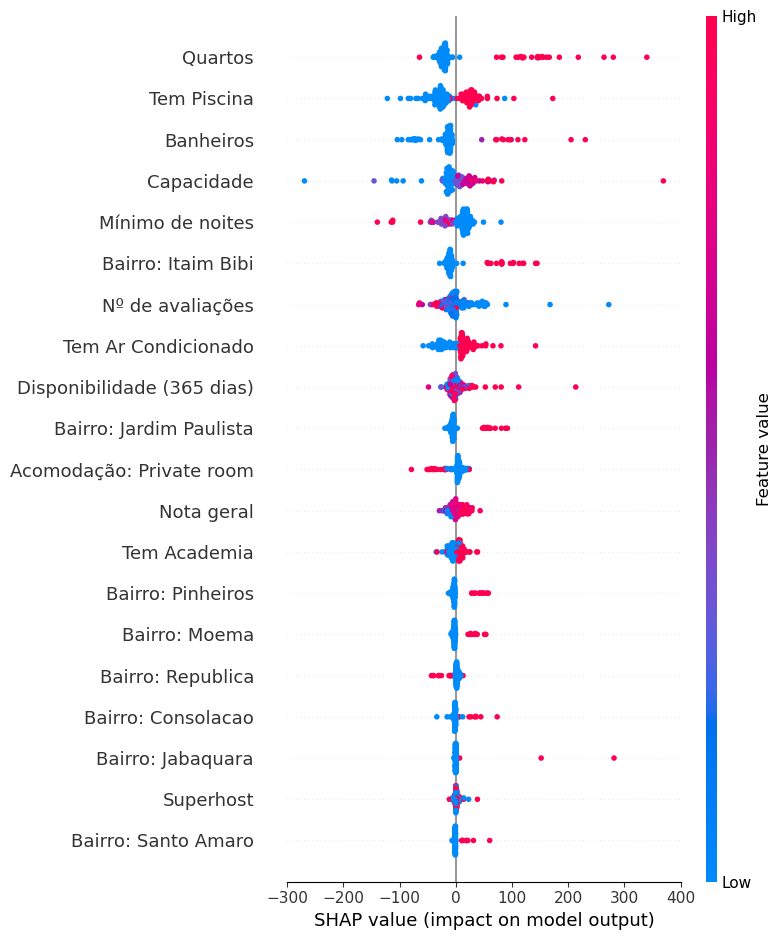

In [79]:
# Interpretação visual com SHAP

labels.update({
    'tem_piscina': 'Tem Piscina',
    'tem_ar_condicionado': 'Tem Ar Condicionado',
    'tem_academia': 'Tem Academia',
    'aceita_pets': 'Aceita Pets'
})

def traduzir_features(nome_coluna):
    # Trata as colunas de bairro (ex: neighbourhood_cleansed_Itaim Bibi -> Bairro: Itaim Bibi)
    if 'neighbourhood_cleansed_' in nome_coluna:
        bairro = nome_coluna.replace('neighbourhood_cleansed_', '')
        return f"Bairro: {bairro}"
    
    elif 'room_type_' in nome_coluna:
        tipo_original = nome_coluna.replace('room_type_', '')
        tipo_traduzido = labels.get(tipo_original, tipo_original)
        return f"Acomodação: {tipo_traduzido}"
    
    else:
        return labels.get(nome_coluna, nome_coluna)

# Inicializando o explainer
explainer = shap.TreeExplainer(modelo_rf)
amostra_X_test = X_test.sample(n=150, random_state=42)

amostra_X_test_traduzida = amostra_X_test.copy()
amostra_X_test_traduzida.rename(columns=lambda x: traduzir_features(x), inplace=True)

# Calculando os valores SHAP
shap_values = explainer.shap_values(amostra_X_test, check_additivity=False)

shap.summary_plot(shap_values, amostra_X_test_traduzida, plot_type="dot")

#### Principais observações

O modelo construído conseguiu explicar aproximadamente 43% da variação dos preços das diárias (R² = 0.4283), com um erro médio absoluto (MAE) de cerca de R$ 101,00. Como a precificação de imóveis de temporada é altamente influenciada por fatores subjetivos e visuais ausentes na base de dados (como qualidade das fotos, estilo de decoração, vista da janela e sofisticação da mobília), este é um patamar preditivo bastante sólido.

A análise visual de interpretabilidade (SHAP) revela de forma cristalina que o tamanho e a infraestrutura mandam na precificação. O **Número de Quartos**, a presença de **Piscina** e o **Número de Banheiros** são, nesta ordem, os três atributos que mais elevam o valor da diária em São Paulo.

A etapa de criação de novas variáveis demonstrou extremo valor para o projeto. A variável `Tem Piscina` — que foi extraída e convertida a partir de uma lista bruta de textos (`amenities`) — provou ser a segunda característica mais importante de todo o conjunto de dados para justificar uma diária mais cara.

O modelo desmistifica a ideia de que apenas a localização dita as regras do jogo. Embora estar nos bairros do Itaim Bibi ou Jardim Paulista empurre os preços para o alto, para o algoritmo, a capacidade física do imóvel e o acesso a lazer exclusivo (piscina) pesaram de forma ainda mais contundente na determinação do preço final.

No extremo oposto, a variável `Acomodação: Quarto privado` apresentou um forte impacto negativo. Hospedagens onde o hóspede não tem o espaço inteiro para si puxam o preço da diária expressivamente para baixo, não importando a localização.

### 20. Clusterização geográfica e de perfil (Machine Learning não supervisionado)

No mercado imobiliário e de hospitalidade, a regra de ouro é: *localização, localização, localização*. Nesta etapa, utilizaremos **Machine Learning não supervisionado (K-Means)** para encontrar padrões ocultos e dividir a cidade de São Paulo em "micro-mercados".

O objetivo é agrupar os anúncios não pelos limites oficiais dos bairros, mas sim por similaridade de perfil: combinando a localização geográfica (`latitude` e `longitude`), o valor cobrado (`price`) e o tamanho do imóvel (`accommodates`).

**Nota técnica:** Algoritmos baseados em distância são sensíveis a escalas e *outliers*. Portanto, criaremos um subconjunto de dados removendo os 5% de preços mais extremos e aplicaremos a padronização (*standardization*) para que o algoritmo trate todas as variáveis com o mesmo peso.

In [80]:
# Preparação e Padronização

# Criando um subconjunto sem os outliers extremos de preço (mantendo 95% dos dados)
limite_preco = df['price'].quantile(0.95)
df_cluster = df[df['price'] <= limite_preco].copy()

# Selecionando as variáveis para a clusterização
features_cluster = ['latitude', 'longitude', 'price', 'accommodates']
X_cluster = df_cluster[features_cluster]

# Padronizando os dados (Média 0 e Desvio Padrão 1)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)

print(f"Dados originais de clusterização: {X_cluster.shape[0]} linhas.")
print("Dados padronizados com sucesso!")

Dados originais de clusterização: 39197 linhas.
Dados padronizados com sucesso!


#### Aplicando o algoritmo K-Means

Vamos aplicar o K-Means para criar **5 clusters distintos**. A escolha desse número busca um equilíbrio entre generalização (poucos grupos) e especialização (muitos grupos), permitindo criar personas claras para os imóveis.

Após o treinamento, vamos calcular a média das variáveis em cada cluster para entender exatamente o que cada grupo representa e criar a "identidade" de cada micro-mercado.

In [81]:
# K-Means e Análise dos Perfis

# Instanciando e treinando o modelo K-Means
kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
df_cluster['cluster'] = kmeans.fit_predict(X_scaled)

df_cluster['cluster_nome'] = df_cluster['cluster'].astype(str)

# Gerando a média das variáveis
perfil_clusters = df_cluster.groupby('cluster')[['price', 'accommodates', 'latitude', 'longitude']].mean().round(2)
perfil_clusters['quantidade_imoveis'] = df_cluster['cluster'].value_counts()

labels_cluster = labels.copy()
labels_cluster.update({
    'latitude': 'Latitude',
    'longitude': 'Longitude',
    'quantidade_imoveis': 'Quantidade de Imóveis'
})

perfil_clusters = perfil_clusters.rename(columns=labels_cluster)
perfil_clusters.index.name = 'Cluster'

display(perfil_clusters)

,Preço (R$),Capacidade,Latitude,Longitude,Quantidade de Imóveis
Cluster,,,,,
0,513.17,3.09,-23.58,-46.67,8498
1,260.03,2.91,-23.53,-46.56,2346
2,445.07,7.80,-23.58,-46.65,1299
3,292.05,2.37,-23.62,-46.68,9656
4,272.86,2.42,-23.55,-46.65,17398


#### Mapeamento dos micro-mercados

Os números nos dizem as médias, mas a verdadeira interpretação geográfica só ocorre quando colocamos esses dados em um mapa. 

Utilizando a biblioteca **Plotly Express**, vamos plotar os imóveis em um mapa interativo. Cada cor representará um cluster (um perfil de imóvel). Ao passar o mouse sobre os pontos, poderemos ver o bairro, o preço e a capacidade. Isso nos permite ver, por exemplo, onde estão concentrados os "Studios executivos mais caros" versus os "Imóveis econômicos e maiores".

In [82]:
fig = px.scatter_map(
    df_cluster, 
    lat="latitude", 
    lon="longitude",
    color="cluster_nome",
    hover_name="neighbourhood_cleansed",
    hover_data={"latitude": False, "longitude": False, "price": True, "accommodates": True},
    color_discrete_sequence=px.colors.qualitative.Set1, # Paleta de cores vibrante
    zoom=10, 
    height=600,
    title="Clusterização de imóveis Airbnb - Perfis geográficos e de preço em São Paulo"
)

fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})

fig.show()

### Principais observações

A aplicação do K-Means nos permitiu sair de uma visão tradicional baseada em bairros e criar uma segmentação focada em **perfis de cConsumo e oOferta**. Analisando o mapa interativo e as médias numéricas, identificamos padrões claros de negócios:

**Cluster 0 (o reduto premium / executivo):** estão fortemente concentrados no eixo nobre da cidade (Centro-Sul/Oeste). São os clássicos "studios premium" focados em viajantes a negócios ou casais dispostos a pagar por alto padrão.

**Clusters 1, 3 e 4 (econômicos e descentralizados):** nas cores **roxa, verde e azul**, respectivamente, vemos perfis com **preços bem abaixo da média (entre R$ 260,03 e R$ 292,05)** e capacidade para cerca de 2 a 3 pessoas. Eles se espalham de forma mais difusa: o azul (Cluster 4) domina a região mais Central/Noroeste e possui o maior volume de oferta (17.398 imóveis), o roxo (Cluster 1) se expande para a Zona Leste, e o verde (Cluster 3) abrange a Zona Sul. Atendem a um público focado em custo-benefício.

**Cluster 2 (imóveis familiares / grupos):** com a cor **laranja**, este cluster revela imóveis projetados para grupos maiores, acomodando em média **7,8 hóspedes**. O valor médio da diária bruta é de R$ 445,07, o que torna o valor pulverizado por pessoa extremamente competitivo. Eles estão concentrados mais ao centro, espalhando-se pontualmente pelas demais regiões.

A precificação e a atuação no Airbnb não podem ser tratadas de forma genérica. Um anfitrião ou investidor não deve analisar apenas o bairro, mas sim o seu "micro-mercado". O algoritmo comprovou que a cidade se divide em bolhas específicas de comportamento, e estratégias de preço, marketing e mobília devem ser direcionadas ao perfil do grupo (cluster) ao qual o imóvel se enquadra.